In [2]:
import os
import re

import pycisTopic

import scanpy as sc
import pandas as pd
import numpy as np
import anndata as ad

import pickle

/home/jool/miniforge3/envs/cistopic/lib/python3.11/site-packages/pycisTopic/__init__.py:3: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import DistributionNotFound, get_distribution


In [3]:
out_dir = "/faststorage/project/projectsInBioinformatics/workspaces/johan/cistopic_outs/"
data_dir = "/faststorage/project/projectsInBioinformatics/workspaces/johan/cistopic_data/"
tmp_dir = os.path.join(out_dir, "tmp")

In [16]:
integrated_data_path = "/faststorage/project/projectsInBioinformatics/workspaces/johan/results/RNA_ATAC_integrated.h5ad"

In [17]:
integrated_data = sc.read(integrated_data_path)

/home/jool/miniforge3/envs/cistopic/lib/python3.11/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(
/home/jool/miniforge3/envs/cistopic/lib/python3.11/site-packages/anndata/_core/anndata.py:1906: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [18]:
integrated_data.obs_names.astype(str).str.replace(r'ATAC_', '', regex = True).str.replace("-1", "", regex = True) + "_" + integrated_data.obs["dataset"].astype(str) 

ATAC_AAACGAAAGGAGGCGA-1    AAACGAAAGGAGGCGA_ATAC_NOA1
ATAC_AAACGAAAGTAACATG-1    AAACGAAAGTAACATG_ATAC_NOA1
ATAC_AAACGAACAAGACTTC-1    AAACGAACAAGACTTC_ATAC_NOA1
ATAC_AAACGAACACAGCCAC-1    AAACGAACACAGCCAC_ATAC_NOA1
ATAC_AAACGAACAGGTAGGT-1    AAACGAACAGGTAGGT_ATAC_NOA1
                                      ...            
TTTGTTGGTCGTGGAA-1               TTTGTTGGTCGTGGAA_OA2
TTTGTTGGTCTGTGGC-1               TTTGTTGGTCTGTGGC_OA2
TTTGTTGGTTCGGCTG-1               TTTGTTGGTTCGGCTG_OA2
TTTGTTGGTTGTCCCT-1               TTTGTTGGTTGTCCCT_OA2
TTTGTTGTCTACCACC-1               TTTGTTGTCTACCACC_OA2
Length: 81406, dtype: object

In [19]:
integrated_data.obs.index = integrated_data.obs_names.astype(str).str.replace(r'ATAC_', '', regex = True) + "_" + integrated_data.obs["dataset"].astype(str) 

In [20]:
integrated_data.obs

,n_genes_by_counts,total_counts,celltype_leiden,dataset
AAACGAAAGGAGGCGA-1_ATAC_NOA1,2354,4533.0,Endothelial,ATAC_NOA1
AAACGAAAGTAACATG-1_ATAC_NOA1,2713,5402.0,Early.Round.SD,ATAC_NOA1
AAACGAACAAGACTTC-1_ATAC_NOA1,3713,7715.0,Macrophage,ATAC_NOA1
AAACGAACACAGCCAC-1_ATAC_NOA1,2468,5002.0,Smooth muscle,ATAC_NOA1
AAACGAACAGGTAGGT-1_ATAC_NOA1,2017,3943.0,Early.Round.SD,ATAC_NOA1
...,...,...,...,...
TTTGTTGGTCGTGGAA-1_OA2,5690,23777.0,Diffing.SPG,OA2
TTTGTTGGTCTGTGGC-1_OA2,5821,23625.0,Diffing.SPG,OA2
TTTGTTGGTTCGGCTG-1_OA2,3699,10872.0,Myoid,OA2
TTTGTTGGTTGTCCCT-1_OA2,5872,49329.0,Diplotene.SC,OA2


In [21]:
atac_cells = integrated_data.obs[integrated_data.obs['dataset'].isin(["ATAC_NOA1", "ATAC_NOA2", "ATAC_NOA3", "ATAC_OA1", "ATAC_OA2"])]

In [13]:
atac_cells.isna().sum()

n_genes_by_counts    0
total_counts         0
celltype_leiden      0
dataset              0
dtype: int64

In [72]:
#atac_cells.to_series().to_csv(os.path.join(out_dir, "ATAC_barcodes.txt"), index = False, header = False)

In [3]:
fragments_dict = {
    "ATAC_NOA1": "/faststorage/project/projectsInBioinformatics/data/PRJNA1177103_aws/SRR31097967_split/SRR31097967/outs/fixed.fragments.tsv.gz",
    "ATAC_NOA2": "/faststorage/project/projectsInBioinformatics/data/PRJNA1177103_aws/SRR31097966_split/SRR31097966/outs/fixed.fragments.tsv.gz",
    "ATAC_NOA3": "/faststorage/project/projectsInBioinformatics/data/PRJNA1177103_aws/SRR31097965_split/SRR31097965/outs/fixed.fragments.tsv.gz",
    "ATAC_OA1":  "/faststorage/project/projectsInBioinformatics/data/PRJNA1177103_aws/SRR31097969_split/SRR31097969/outs/fixed.fragments.tsv.gz",
    "ATAC_OA2":  "/faststorage/project/projectsInBioinformatics/data/PRJNA1177103_aws/SRR31097968_split/SRR31097968/outs/fixed.fragments.tsv.gz"
                 }

#consensus_peaks = os.path.join(data_dir, "consensus_peaks.bed")

In [10]:
chromsizes = pd.read_table(
    "http://hgdownload.cse.ucsc.edu/goldenPath/hg38/bigZips/hg38.chrom.sizes",
    header = None,
    names = ["Chromosome", "End"]
)
chromsizes.insert(1, "Start", 0)

In [97]:
from pycisTopic.pseudobulk_peak_calling import export_pseudobulk

os.makedirs(os.path.join(out_dir, "consensus_peak_calling"), exist_ok = True)
os.makedirs(os.path.join(out_dir, "consensus_peak_calling/pseudobulk_bed_files"), exist_ok = True)
os.makedirs(os.path.join(out_dir, "consensus_peak_calling/pseudobulk_bw_files"), exist_ok = True)

bw_paths, bed_paths = export_pseudobulk(
    input_data = atac_cells,
    variable = "celltype_leiden",
    sample_id_col = "dataset",
    chromsizes = chromsizes,
    bed_path = os.path.join(out_dir, "consensus_peak_calling/pseudobulk_bed_files"),
    bigwig_path = os.path.join(out_dir, "consensus_peak_calling/pseudobulk_bw_files"),
    path_to_fragments = fragments_dict,
    n_cpu = 1,
    normalize_bigwig = True,
    #temp_dir = "/tmp",
    split_pattern = "_"
)

2025-12-02 16:45:04,984 cisTopic     INFO     Splitting fragments by cell type.


IOStream.flush timed out
IOStream.flush timed out


2025-12-02 16:51:57,208 cisTopic     INFO     generating bigwig files
2025-12-02 16:52:22,198 cisTopic     INFO     /faststorage/project/projectsInBioinformatics/workspaces/johan/cistopic_outs/consensus_peak_calling/pseudobulk_bw_files/Endothelial.bw done!
2025-12-02 16:54:04,209 cisTopic     INFO     /faststorage/project/projectsInBioinformatics/workspaces/johan/cistopic_outs/consensus_peak_calling/pseudobulk_bw_files/Early.Round.SD.bw done!
2025-12-02 16:54:29,169 cisTopic     INFO     /faststorage/project/projectsInBioinformatics/workspaces/johan/cistopic_outs/consensus_peak_calling/pseudobulk_bw_files/Macrophage.bw done!
2025-12-02 16:54:40,863 cisTopic     INFO     /faststorage/project/projectsInBioinformatics/workspaces/johan/cistopic_outs/consensus_peak_calling/pseudobulk_bw_files/Smooth_muscle.bw done!
2025-12-02 16:55:42,196 cisTopic     INFO     /faststorage/project/projectsInBioinformatics/workspaces/johan/cistopic_outs/consensus_peak_calling/pseudobulk_bw_files/Leydig.bw do

In [98]:
with open(os.path.join(out_dir, "consensus_peak_calling/bw_paths.tsv"), "wt") as f:
    for v in bw_paths:
        _ = f.write(f"{v}\t{bw_paths[v]}\n")

with open(os.path.join(out_dir, "consensus_peak_calling/bed_paths.tsv"), "wt") as f:
    for v in bed_paths:
        _ = f.write(f"{v}\t{bed_paths[v]}\n")

In [9]:
bw_paths = {}
with open(os.path.join(out_dir, "consensus_peak_calling/bw_paths.tsv")) as f:
    for line in f:
        v, p = line.strip().split("\t")
        bw_paths.update({v: p})

bed_paths = {}
with open(os.path.join(out_dir, "consensus_peak_calling/bed_paths.tsv")) as f:
    for line in f:
        v, p = line.strip().split("\t")
        bed_paths.update({v: p})

In [10]:
from pycisTopic.pseudobulk_peak_calling import peak_calling
macs_path = "/home/jool/miniforge3/envs/cistopic/bin/macs3"

os.makedirs(os.path.join(out_dir, "consensus_peak_calling/MACS"), exist_ok = True)

narrow_peak_dict = peak_calling(
    macs_path = macs_path,
    bed_paths = bed_paths,
    outdir = os.path.join(os.path.join(out_dir, "consensus_peak_calling/MACS")),
    genome_size = 'hs',
    n_cpu = 1,
    input_format = 'BEDPE',
    shift = 73,
    ext_size = 146,
    keep_dup = 'all',
    q_value = 0.05,
    #_temp_dir = '/scratch/leuven/330/vsc33053/ray_spill'
)

2025-12-03 13:01:38,150 cisTopic     INFO     Calling peaks for Endothelial with /home/jool/miniforge3/envs/cistopic/bin/macs3 callpeak --treatment /faststorage/project/projectsInBioinformatics/workspaces/johan/cistopic_outs/consensus_peak_calling/pseudobulk_bed_files/Endothelial.fragments.tsv.gz --name Endothelial  --outdir /faststorage/project/projectsInBioinformatics/workspaces/johan/cistopic_outs/consensus_peak_calling/MACS --format BEDPE --gsize hs --qvalue 0.05 --nomodel --shift 73 --extsize 146 --keep-dup all --call-summits --nolambda
2025-12-03 13:02:18,085 cisTopic     INFO     Endothelial done!
2025-12-03 13:02:18,086 cisTopic     INFO     Calling peaks for Early.Round.SD with /home/jool/miniforge3/envs/cistopic/bin/macs3 callpeak --treatment /faststorage/project/projectsInBioinformatics/workspaces/johan/cistopic_outs/consensus_peak_calling/pseudobulk_bed_files/Early.Round.SD.fragments.tsv.gz --name Early.Round.SD  --outdir /faststorage/project/projectsInBioinformatics/worksp

In [11]:
from pycisTopic.iterative_peak_calling import get_consensus_peaks
# Other param
peak_half_width=250
path_to_blacklist=os.path.join(data_dir, "ENCFF356LFX.bed")
# Get consensus peaks
consensus_peaks = get_consensus_peaks(
    narrow_peaks_dict = narrow_peak_dict,
    peak_half_width = peak_half_width,
    chromsizes = chromsizes,
    path_to_blacklist = path_to_blacklist)

2025-12-03 13:42:25,842 cisTopic     INFO     Extending and merging peaks per class
2025-12-03 13:43:28,602 cisTopic     INFO     Normalizing peak scores
2025-12-03 13:43:29,102 cisTopic     INFO     Merging peaks
Warning! Start and End columns now have different dtypes: int64 and int32
2025-12-03 13:44:15,339 cisTopic     INFO     Done!


In [12]:
consensus_peaks.to_bed(
    path = os.path.join(out_dir, "consensus_peak_calling/consensus_regions.bed"),
    keep =True,
    compression = 'infer',
    chain = False)

/home/jool/miniforge3/envs/cistopic/lib/python3.11/site-packages/pyranges/out.py:37: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  return pd.concat([outdf, df.get(noncanonical)], axis=1)
/home/jool/miniforge3/envs/cistopic/lib/python3.11/site-packages/pyranges/out.py:37: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  return pd.concat([outdf, df.get(noncanonical)], axis=1)
/home/jool/miniforge3/envs/cistopic/lib/python3.11/site-packages/pyranges/out.py:37: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  return pd.concat([outdf, df.get(noncanonical)], axis=1)
/home/jool/miniforge3/envs/cistopic/lib/python3.11/site-packages/pyranges/out.py:37: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  return pd.concat([outdf, df.get(

In [ ]:
# Patched /home/jool/miniforge3/envs/cistopic/lib/python3.11/site-packages/pycisTopic/gene_annotation.py
# tss.bed downloaded by:
# pycistopic tss get_tss -o tss.bed -n "hsapiens_gene_ensembl" --to-chrom-source ucsc --ucsc hg38
 

In [21]:
regions_bed_filename = os.path.join(out_dir, "consensus_peak_calling/consensus_regions.bed")
tss_bed_filename = os.path.join(out_dir, "qc", "tss.bed")

pycistopic_qc_commands_filename = "pycistopic_qc_commands.txt"

# Create text file with all pycistopic qc command lines.
with open(pycistopic_qc_commands_filename, "w") as fh:
    for sample, fragment_filename in fragments_dict.items():
        print(
            "pycistopic qc",
            f"--fragments {fragment_filename}",
            f"--regions {regions_bed_filename}",
            f"--tss {tss_bed_filename}",
            f"--output {os.path.join(out_dir, 'qc')}/{sample}",
            sep=" ",
            file=fh
        )

In [ ]:
# cat pycistopic_qc_commands.txt | parallel -j 4 {}

In [5]:
from pycisTopic.plotting.qc_plot import plot_sample_stats, plot_barcode_stats
import matplotlib.pyplot as plt

In [4]:
pycistopic_qc_output_dir = os.path.join(out_dir, "qc")

/home/jool/miniforge3/envs/cistopic/lib/python3.11/site-packages/pycisTopic/plotting/qc_plot.py:226: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


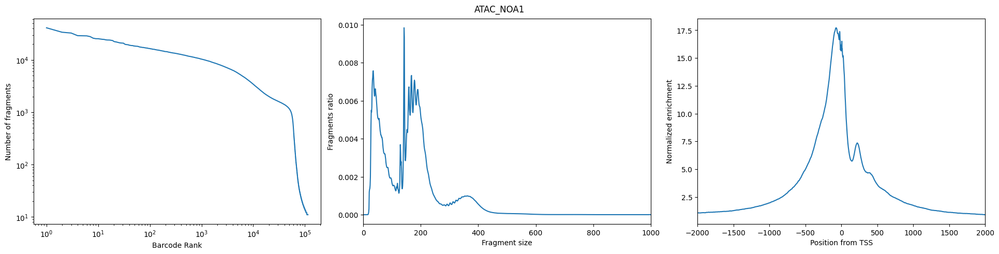

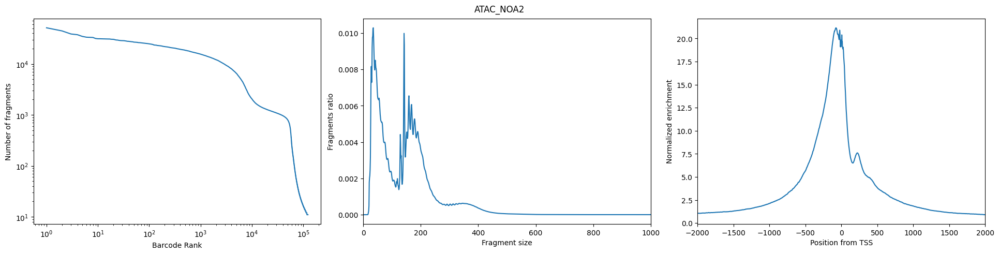

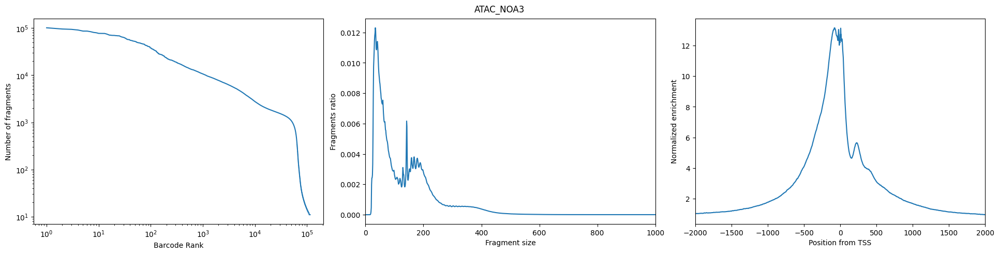

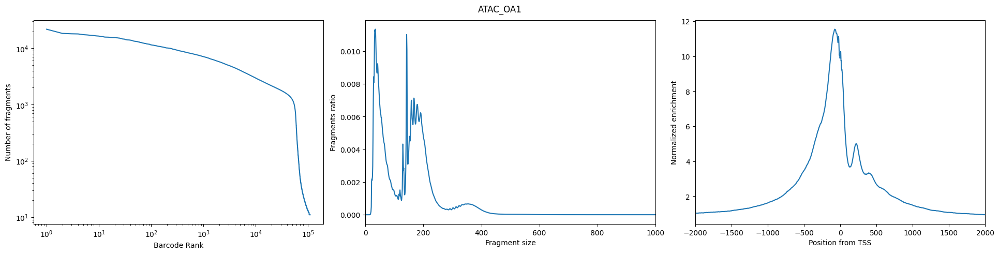

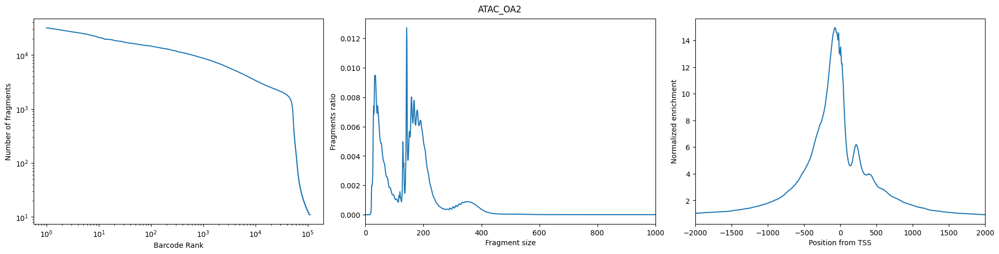

In [25]:
for sample_id in fragments_dict:
    fig = plot_sample_stats(
        sample_id = sample_id,
        pycistopic_qc_output_dir = pycistopic_qc_output_dir
    )

In [5]:
from pycisTopic.qc import get_barcodes_passing_qc_for_sample
sample_id_to_barcodes_passing_filters = {}
sample_id_to_thresholds = {}
for sample_id in fragments_dict:
    (
        sample_id_to_barcodes_passing_filters[sample_id],
        sample_id_to_thresholds[sample_id]
    ) = get_barcodes_passing_qc_for_sample(
            sample_id = sample_id,
            pycistopic_qc_output_dir = pycistopic_qc_output_dir,
            unique_fragments_threshold = None, # use automatic thresholding
            tss_enrichment_threshold = None, # use automatic thresholding
            frip_threshold = 0,
            use_automatic_thresholds = True,
    )

ATAC_NOA1:
	Using automatic threshold for unique fragments: 846.6703748061291
	Using automatic threshold for TSS enrichment: 14.541227792497548
ATAC_NOA2:
	Using automatic threshold for unique fragments: 976.4688142514175
	Using automatic threshold for TSS enrichment: 14.274000622639587
ATAC_NOA3:
	Using automatic threshold for unique fragments: 776.849441827486
	Using automatic threshold for TSS enrichment: 11.716861386138614
ATAC_OA1:
	Using automatic threshold for unique fragments: 621.9939906605767
	Using automatic threshold for TSS enrichment: 12.538142312301801
ATAC_OA2:
	Using automatic threshold for unique fragments: 939.6235950832313
	Using automatic threshold for TSS enrichment: 12.826344576736965


/home/jool/miniforge3/envs/cistopic/lib/python3.11/site-packages/pycisTopic/plotting/qc_plot.py:446: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


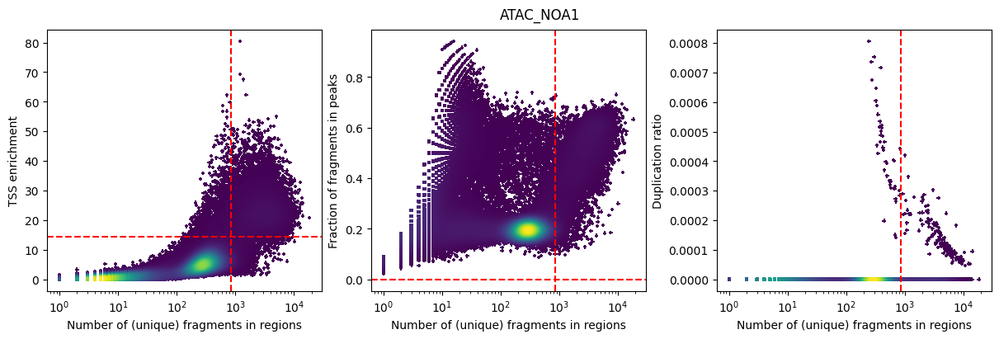

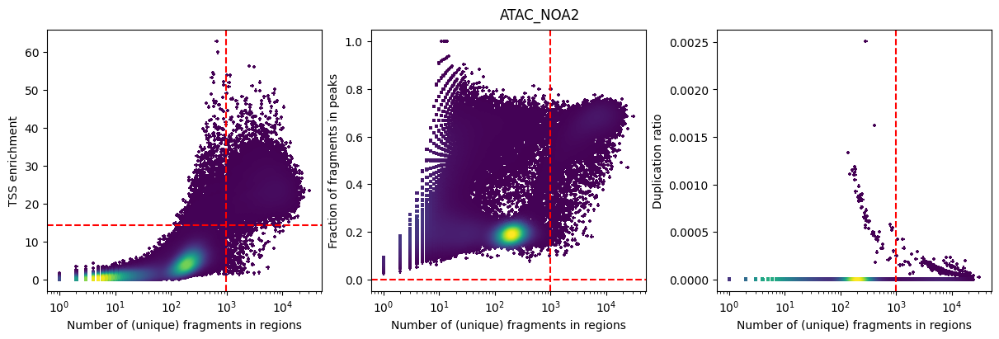

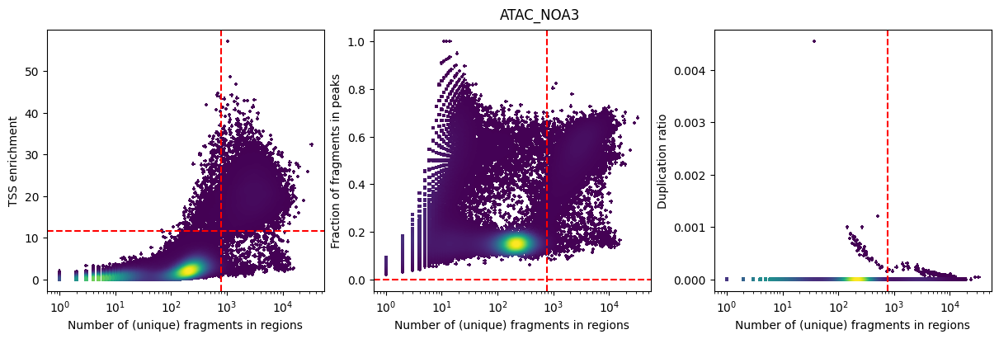

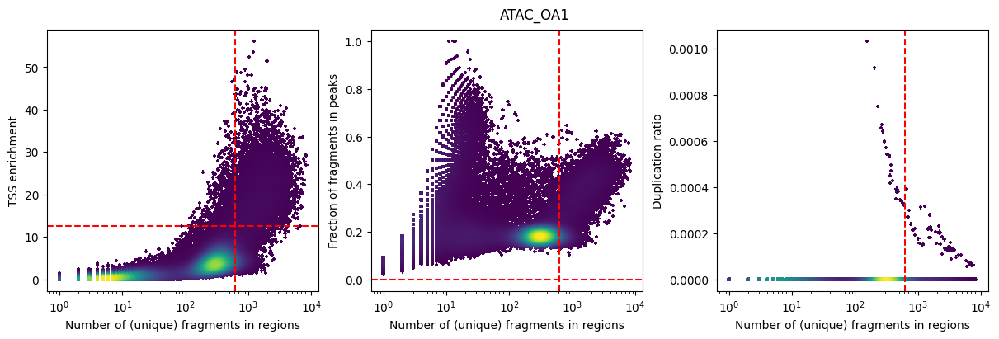

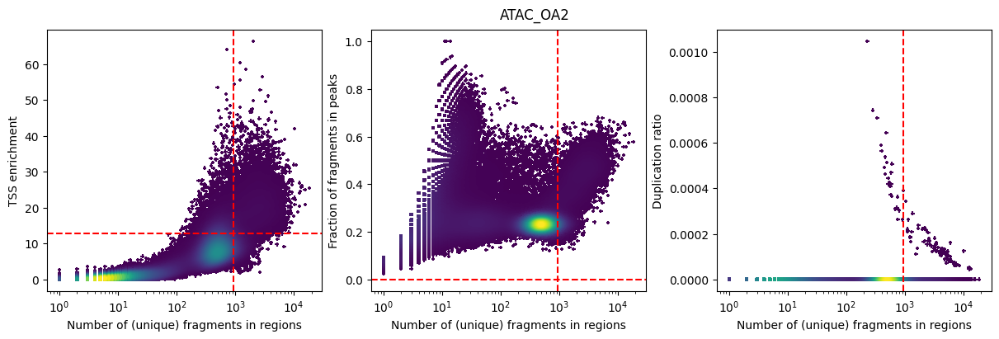

In [29]:
for sample_id in fragments_dict:
    fig = plot_barcode_stats(
        sample_id = sample_id,
        pycistopic_qc_output_dir = pycistopic_qc_output_dir,
        bc_passing_filters = sample_id_to_barcodes_passing_filters[sample_id],
        detailed_title = False,
        **sample_id_to_thresholds[sample_id]
    )

In [6]:
path_to_regions = os.path.join(out_dir, "consensus_peak_calling/consensus_regions.bed")
path_to_blacklist= os.path.join(data_dir, "ENCFF356LFX.bed")

from pycisTopic.cistopic_class import create_cistopic_object_from_fragments, merge
import polars as pl

cistopic_obj_list = []
for sample_id in fragments_dict:
    sample_metrics = pl.read_parquet(
        os.path.join(pycistopic_qc_output_dir, f'{sample_id}.fragments_stats_per_cb.parquet')
    ).to_pandas().set_index("CB").loc[ sample_id_to_barcodes_passing_filters[sample_id] ]
    cistopic_obj = create_cistopic_object_from_fragments(
        path_to_fragments = fragments_dict[sample_id],
        path_to_regions = path_to_regions,
        path_to_blacklist = path_to_blacklist,
        metrics = sample_metrics,
        valid_bc = sample_id_to_barcodes_passing_filters[sample_id],
        n_cpu = 1,
        project = sample_id,
        split_pattern = '_'
    )
    cistopic_obj_list.append(cistopic_obj)

merged_cistopic_obj = merge(cistopic_obj_list, project = "cistopic_merged")

pickle.dump(
    merged_cistopic_obj,
    open(os.path.join(out_dir, "merged_cistopic_obj.pkl"), "wb")
)

2025-12-16 14:36:12,621 cisTopic     INFO     Reading data for ATAC_NOA1
2025-12-16 14:38:17,473 cisTopic     INFO     Collapsing duplicates
2025-12-16 14:43:19,149 cisTopic     INFO     metrics provided!
2025-12-16 14:43:25,977 cisTopic     INFO     Counting fragments in regions
2025-12-16 14:43:50,804 cisTopic     INFO     Creating fragment matrix


/home/jool/miniforge3/envs/cistopic/lib/python3.11/site-packages/pycisTopic/cistopic_class.py:886: PerformanceWarning: The following operation may generate 4236036300 cells in the resulting pandas object.
  .unstack(level="Name", fill_value=0)


2025-12-16 14:44:16,527 cisTopic     INFO     Converting fragment matrix to sparse matrix
2025-12-16 14:44:31,522 cisTopic     INFO     Removing blacklisted regions
2025-12-16 14:44:32,571 cisTopic     INFO     Creating CistopicObject
2025-12-16 14:44:34,066 cisTopic     INFO     Done!
2025-12-16 14:44:36,131 cisTopic     INFO     Reading data for ATAC_NOA2
2025-12-16 14:47:47,546 cisTopic     INFO     Collapsing duplicates
2025-12-16 14:52:18,732 cisTopic     INFO     metrics provided!
2025-12-16 14:52:24,946 cisTopic     INFO     Counting fragments in regions
2025-12-16 14:52:59,384 cisTopic     INFO     Creating fragment matrix


/home/jool/miniforge3/envs/cistopic/lib/python3.11/site-packages/pycisTopic/cistopic_class.py:886: PerformanceWarning: The following operation may generate 3584735685 cells in the resulting pandas object.
  .unstack(level="Name", fill_value=0)


2025-12-16 14:53:29,147 cisTopic     INFO     Converting fragment matrix to sparse matrix
2025-12-16 14:53:42,416 cisTopic     INFO     Removing blacklisted regions
2025-12-16 14:53:43,400 cisTopic     INFO     Creating CistopicObject
2025-12-16 14:53:44,267 cisTopic     INFO     Done!
2025-12-16 14:53:46,864 cisTopic     INFO     Reading data for ATAC_NOA3
2025-12-16 14:57:06,618 cisTopic     INFO     Collapsing duplicates
2025-12-16 15:01:59,861 cisTopic     INFO     metrics provided!
2025-12-16 15:02:05,622 cisTopic     INFO     Counting fragments in regions
2025-12-16 15:02:25,032 cisTopic     INFO     Creating fragment matrix


/home/jool/miniforge3/envs/cistopic/lib/python3.11/site-packages/pycisTopic/cistopic_class.py:886: PerformanceWarning: The following operation may generate 3309572504 cells in the resulting pandas object.
  .unstack(level="Name", fill_value=0)


2025-12-16 15:02:44,722 cisTopic     INFO     Converting fragment matrix to sparse matrix
2025-12-16 15:02:56,565 cisTopic     INFO     Removing blacklisted regions
2025-12-16 15:02:57,520 cisTopic     INFO     Creating CistopicObject
2025-12-16 15:02:58,178 cisTopic     INFO     Done!
2025-12-16 15:03:02,049 cisTopic     INFO     Reading data for ATAC_OA1
2025-12-16 15:06:30,372 cisTopic     INFO     Collapsing duplicates
2025-12-16 15:11:05,912 cisTopic     INFO     metrics provided!
2025-12-16 15:11:13,836 cisTopic     INFO     Counting fragments in regions
2025-12-16 15:11:24,647 cisTopic     INFO     Creating fragment matrix


/home/jool/miniforge3/envs/cistopic/lib/python3.11/site-packages/pycisTopic/cistopic_class.py:886: PerformanceWarning: The following operation may generate 2833303083 cells in the resulting pandas object.
  .unstack(level="Name", fill_value=0)


2025-12-16 15:11:37,598 cisTopic     INFO     Converting fragment matrix to sparse matrix
2025-12-16 15:11:47,499 cisTopic     INFO     Removing blacklisted regions
2025-12-16 15:11:48,428 cisTopic     INFO     Creating CistopicObject
2025-12-16 15:11:48,961 cisTopic     INFO     Done!
2025-12-16 15:11:51,983 cisTopic     INFO     Reading data for ATAC_OA2
2025-12-16 15:15:53,182 cisTopic     INFO     Collapsing duplicates
2025-12-16 15:21:17,236 cisTopic     INFO     metrics provided!
2025-12-16 15:21:25,787 cisTopic     INFO     Counting fragments in regions
2025-12-16 15:21:39,877 cisTopic     INFO     Creating fragment matrix


/home/jool/miniforge3/envs/cistopic/lib/python3.11/site-packages/pycisTopic/cistopic_class.py:886: PerformanceWarning: The following operation may generate 2689177910 cells in the resulting pandas object.
  .unstack(level="Name", fill_value=0)


2025-12-16 15:21:56,954 cisTopic     INFO     Converting fragment matrix to sparse matrix
2025-12-16 15:22:06,897 cisTopic     INFO     Removing blacklisted regions
2025-12-16 15:22:09,830 cisTopic     INFO     Creating CistopicObject
2025-12-16 15:22:10,513 cisTopic     INFO     Done!
2025-12-16 15:22:13,819 cisTopic     INFO     cisTopic object 1 merged
2025-12-16 15:22:17,692 cisTopic     INFO     cisTopic object 2 merged
2025-12-16 15:22:21,858 cisTopic     INFO     cisTopic object 3 merged
2025-12-16 15:22:26,313 cisTopic     INFO     cisTopic object 4 merged


In [7]:
merged_cistopic_obj

In [11]:
with open(os.path.join(out_dir, "merged_cistopic_obj.pkl"), "rb") as f:
    merged_cistopic_obj = pickle.load(f)

In [12]:
merged_cistopic_obj.cell_names

['GGCGAAAAGAGGTACC-1_ATAC_NOA1___ATAC_NOA1',
 'TAGGTGTCAGATAAGT-1_ATAC_NOA1___ATAC_NOA1',
 'GTGGATTAGGTGTTGG-1_ATAC_NOA1___ATAC_NOA1',
 'CTTCTAATCTAGCAGT-1_ATAC_NOA1___ATAC_NOA1',
 'TACTGCCCAAGGATGC-1_ATAC_NOA1___ATAC_NOA1',
 'CTCTCAGGTGCACCCA-1_ATAC_NOA1___ATAC_NOA1',
 'TTACTCACAGCTTACA-1_ATAC_NOA1___ATAC_NOA1',
 'TAACGGTAGCTCGTTA-1_ATAC_NOA1___ATAC_NOA1',
 'AGCTATGGTAGCATGG-1_ATAC_NOA1___ATAC_NOA1',
 'TCGAGCGAGTCGGGAT-1_ATAC_NOA1___ATAC_NOA1',
 'GAACTTGTCTATGAGC-1_ATAC_NOA1___ATAC_NOA1',
 'TAAGCCAGTCGCTAGC-1_ATAC_NOA1___ATAC_NOA1',
 'GAAAGTAAGATTACGA-1_ATAC_NOA1___ATAC_NOA1',
 'GACCTTCCAATGTAAG-1_ATAC_NOA1___ATAC_NOA1',
 'TCGCAGGGTTCCTATT-1_ATAC_NOA1___ATAC_NOA1',
 'ACCTGCTTCAAACCCA-1_ATAC_NOA1___ATAC_NOA1',
 'CGAGTTATCAGTCAAC-1_ATAC_NOA1___ATAC_NOA1',
 'CCTCCCTGTCGTAGTT-1_ATAC_NOA1___ATAC_NOA1',
 'CTGCTCATCCGAGGAA-1_ATAC_NOA1___ATAC_NOA1',
 'ATTACTCAGTGAACCG-1_ATAC_NOA1___ATAC_NOA1',
 'CAAGGCCTCCTTACGC-1_ATAC_NOA1___ATAC_NOA1',
 'CCGTGAGCATGCTATG-1_ATAC_NOA1___ATAC_NOA1',
 'TGACTCCC

In [13]:
cleaned_names = [name.split("___")[0] for name in merged_cistopic_obj.cell_names]
cleaned_names

['GGCGAAAAGAGGTACC-1_ATAC_NOA1',
 'TAGGTGTCAGATAAGT-1_ATAC_NOA1',
 'GTGGATTAGGTGTTGG-1_ATAC_NOA1',
 'CTTCTAATCTAGCAGT-1_ATAC_NOA1',
 'TACTGCCCAAGGATGC-1_ATAC_NOA1',
 'CTCTCAGGTGCACCCA-1_ATAC_NOA1',
 'TTACTCACAGCTTACA-1_ATAC_NOA1',
 'TAACGGTAGCTCGTTA-1_ATAC_NOA1',
 'AGCTATGGTAGCATGG-1_ATAC_NOA1',
 'TCGAGCGAGTCGGGAT-1_ATAC_NOA1',
 'GAACTTGTCTATGAGC-1_ATAC_NOA1',
 'TAAGCCAGTCGCTAGC-1_ATAC_NOA1',
 'GAAAGTAAGATTACGA-1_ATAC_NOA1',
 'GACCTTCCAATGTAAG-1_ATAC_NOA1',
 'TCGCAGGGTTCCTATT-1_ATAC_NOA1',
 'ACCTGCTTCAAACCCA-1_ATAC_NOA1',
 'CGAGTTATCAGTCAAC-1_ATAC_NOA1',
 'CCTCCCTGTCGTAGTT-1_ATAC_NOA1',
 'CTGCTCATCCGAGGAA-1_ATAC_NOA1',
 'ATTACTCAGTGAACCG-1_ATAC_NOA1',
 'CAAGGCCTCCTTACGC-1_ATAC_NOA1',
 'CCGTGAGCATGCTATG-1_ATAC_NOA1',
 'TGACTCCCAAACAGTA-1_ATAC_NOA1',
 'TGCATGAGTTCCATCC-1_ATAC_NOA1',
 'ACAAGCTCAAGCCCTG-1_ATAC_NOA1',
 'CTGGCAGGTGCTAGTT-1_ATAC_NOA1',
 'ACAAGCTCACGTTAGT-1_ATAC_NOA1',
 'GCACCTTTCTCGCGGA-1_ATAC_NOA1',
 'ATGTACGAGCACACCC-1_ATAC_NOA1',
 'TACTAGGAGAGAATTC-1_ATAC_NOA1',
 'AACCTTTG

In [14]:
merged_cistopic_obj.cell_names = cleaned_names

In [15]:
merged_cistopic_obj.cell_data

,cisTopic_nr_frag,cisTopic_log_nr_frag,cisTopic_nr_acc,cisTopic_log_nr_acc,sample_id,barcode_rank,total_fragments_count,log10_total_fragments_count,unique_fragments_count,log10_unique_fragments_count,...,log10_unique_fragments_in_peaks_count,fraction_of_fragments_in_peaks,duplication_count,duplication_ratio,nucleosome_signal,tss_enrichment,pdf_values_for_tss_enrichment,pdf_values_for_fraction_of_fragments_in_peaks,pdf_values_for_duplication_ratio,barcode
GGCGAAAAGAGGTACC-1_ATAC_NOA1___ATAC_NOA1,1590,3.201397,1526,3.183555,ATAC_NOA1,8180,4042,3.606704,4042,3.606704,...,3.187803,0.381000,0,0.0,0.973839,19.808031,0.005254,0.302492,27452.846611,GGCGAAAAGAGGTACC-1
TAGGTGTCAGATAAGT-1_ATAC_NOA1___ATAC_NOA1,8666,3.937819,7715,3.887336,ATAC_NOA1,55,18306,4.262617,18306,4.262617,...,3.923399,0.457883,0,0.0,0.966418,30.330513,0.000626,0.037838,6527.938476,TAGGTGTCAGATAAGT-1
GTGGATTAGGTGTTGG-1_ATAC_NOA1___ATAC_NOA1,6751,3.829368,6108,3.785899,ATAC_NOA1,641,11508,4.061038,11508,4.061038,...,3.813648,0.565693,0,0.0,0.967488,28.075244,0.002023,0.237566,13031.374667,GTGGATTAGGTGTTGG-1
CTTCTAATCTAGCAGT-1_ATAC_NOA1___ATAC_NOA1,4929,3.692759,4438,3.647187,ATAC_NOA1,1024,10305,4.013090,10305,4.013090,...,3.676236,0.460359,0,0.0,1.275896,25.191461,0.005275,0.197100,22171.183555,CTTCTAATCTAGCAGT-1
TACTGCCCAAGGATGC-1_ATAC_NOA1___ATAC_NOA1,3163,3.500099,2974,3.473341,ATAC_NOA1,4322,6125,3.787177,6125,3.787177,...,3.483302,0.496653,0,0.0,1.293869,35.871225,0.001225,0.406095,28620.279546,TACTGCCCAAGGATGC-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TCCAGAAAGTGGGACT-1_ATAC_OA2___ATAC_OA2,1629,3.211921,1574,3.197005,ATAC_OA2,11247,3170,3.501196,3170,3.501196,...,3.202488,0.502524,0,0.0,0.776628,24.051955,0.003184,0.146076,36718.520370,TCCAGAAAGTGGGACT-1
CCCTGATCATGGCCGT-1_ATAC_OA2___ATAC_OA2,1503,3.176959,1465,3.165838,ATAC_OA2,11714,3111,3.493040,3111,3.493040,...,3.166430,0.471231,0,0.0,0.791508,13.277159,0.007087,0.202594,41610.901829,CCCTGATCATGGCCGT-1
CCTAAAGGTGCGTAGA-1_ATAC_OA2___ATAC_OA2,1304,3.115278,1281,3.107549,ATAC_OA2,19731,2493,3.396896,2493,3.396896,...,3.102091,0.507020,0,0.0,0.755401,20.955604,0.003815,0.076102,54743.100143,CCTAAAGGTGCGTAGA-1
TTACGTTAGGTTGTGG-1_ATAC_OA2___ATAC_OA2,1154,3.062206,1131,3.053463,ATAC_OA2,17154,2630,3.420121,2630,3.420121,...,3.048442,0.424715,0,0.0,0.868585,23.459098,0.002495,0.207087,71514.269544,TTACGTTAGGTTGTGG-1


In [14]:
atac_cells

,n_genes_by_counts,total_counts,celltype_leiden,dataset
AAACGAAAGGAGGCGA-1_ATAC_NOA1,2354,4533.0,Endothelial,ATAC_NOA1
AAACGAAAGTAACATG-1_ATAC_NOA1,2713,5402.0,Early.Round.SD,ATAC_NOA1
AAACGAACAAGACTTC-1_ATAC_NOA1,3713,7715.0,Macrophage,ATAC_NOA1
AAACGAACACAGCCAC-1_ATAC_NOA1,2468,5002.0,Smooth muscle,ATAC_NOA1
AAACGAACAGGTAGGT-1_ATAC_NOA1,2017,3943.0,Early.Round.SD,ATAC_NOA1
...,...,...,...,...
TTTGTGTTCCTGAAAC-1_ATAC_OA2,648,1229.0,Myoid,ATAC_OA2
TTTGTGTTCGCGCTGA-1_ATAC_OA2,715,1275.0,Diffed.SPG,ATAC_OA2
TTTGTGTTCTATGAGC-1_ATAC_OA2,953,1841.0,Diplotene.SC,ATAC_OA2
TTTGTGTTCTCTATCA-1_ATAC_OA2,1848,3727.0,Round.SD,ATAC_OA2


In [22]:
merged_cistopic_obj.add_cell_data(atac_cells, split_pattern=None)

In [24]:
keep_cells = merged_cistopic_obj.cell_data.dropna().index
merged_cistopic_obj.subset(keep_cells)

Preprocessing...


/home/jool/miniforge3/envs/cistopic/lib/python3.11/site-packages/scrublet/helper_functions.py:252: RuntimeWarning: invalid value encountered in sqrt
  CV_input = np.sqrt(b);


Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.42
Detected doublet rate = 3.2%
Estimated detectable doublet fraction = 27.2%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 11.9%
Elapsed time: 279.1 seconds
Detected doublet rate = 15.8%
Estimated detectable doublet fraction = 59.7%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 26.5%


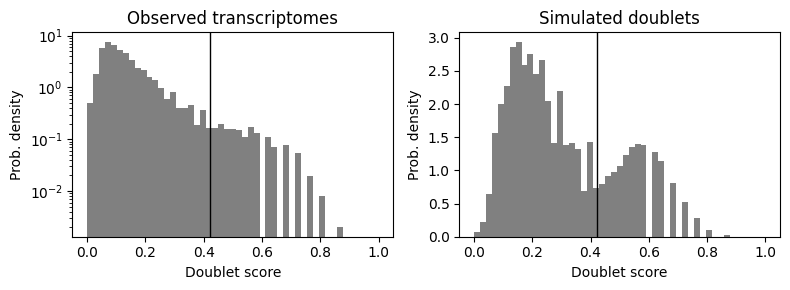

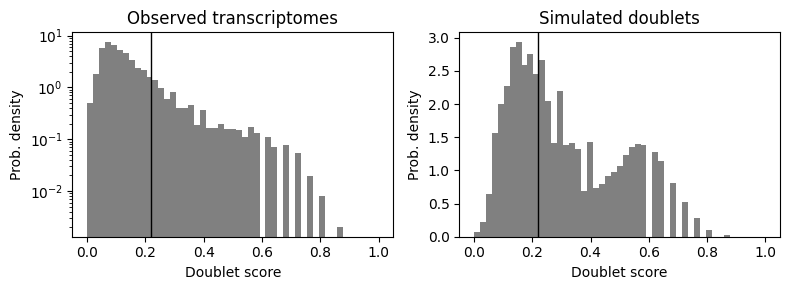

In [25]:
import scrublet as scr
scrub = scr.Scrublet(merged_cistopic_obj.fragment_matrix.T, expected_doublet_rate=0.1)
doublet_scores, predicted_doublets = scrub.scrub_doublets()
scrub.plot_histogram();
scrub.call_doublets(threshold=0.22)
scrub.plot_histogram();
scrublet = pd.DataFrame([scrub.doublet_scores_obs_, scrub.predicted_doublets_], columns=merged_cistopic_obj.cell_names, index=['Doublet_scores_fragments', 'Predicted_doublets_fragments']).T

In [26]:
merged_cistopic_obj.add_cell_data(scrublet, split_pattern = None)
sum(merged_cistopic_obj.cell_data.Predicted_doublets_fragments == True)

3908

In [27]:
# Remove doublets
singlets = merged_cistopic_obj.cell_data[merged_cistopic_obj.cell_data.Predicted_doublets_fragments == False].index.tolist()
# Subset cisTopic object
merged_cistopic_obj_noDBL = merged_cistopic_obj.subset(singlets, copy=True, split_pattern=None)

In [28]:
pickle.dump(
    merged_cistopic_obj_noDBL,
    open(os.path.join(out_dir, "cleaned_cistopic_obj.pkl"), "wb")
)

In [7]:
with open(os.path.join(out_dir, "cleaned_cistopic_obj.pkl"), "rb") as f:
    cleaned_cistopic_obj = pickle.load(f)

In [8]:
# Models run on slurm
# /faststorage/project/projectsInBioinformatics/workspaces/johan/cistopic_outs/mallet_models

In [9]:
cleaned_cistopic_obj.cell_data

,cisTopic_nr_frag,cisTopic_log_nr_frag,cisTopic_nr_acc,cisTopic_log_nr_acc,sample_id,barcode_rank,total_fragments_count,log10_total_fragments_count,unique_fragments_count,log10_unique_fragments_count,...,pdf_values_for_tss_enrichment,pdf_values_for_fraction_of_fragments_in_peaks,pdf_values_for_duplication_ratio,barcode,n_genes_by_counts,total_counts,celltype_leiden,dataset,Doublet_scores_fragments,Predicted_doublets_fragments
TAGGTGTCAGATAAGT-1_ATAC_NOA1,8666,3.937819,7715,3.887336,ATAC_NOA1,55,18306,4.262617,18306,4.262617,...,0.000626,0.037838,6527.938476,TAGGTGTCAGATAAGT-1,5673.0,12722.0,Macrophage,ATAC_NOA1,0.106466,False
GTGGATTAGGTGTTGG-1_ATAC_NOA1,6751,3.829368,6108,3.785899,ATAC_NOA1,641,11508,4.061038,11508,4.061038,...,0.002023,0.237566,13031.374667,GTGGATTAGGTGTTGG-1,4729.0,10263.0,Sertoli,ATAC_NOA1,0.181043,False
CTTCTAATCTAGCAGT-1_ATAC_NOA1,4929,3.692759,4438,3.647187,ATAC_NOA1,1024,10305,4.013090,10305,4.013090,...,0.005275,0.197100,22171.183555,CTTCTAATCTAGCAGT-1,3029.0,6694.0,Myoid,ATAC_NOA1,0.131876,False
TACTGCCCAAGGATGC-1_ATAC_NOA1,3163,3.500099,2974,3.473341,ATAC_NOA1,4322,6125,3.787177,6125,3.787177,...,0.001225,0.406095,28620.279546,TACTGCCCAAGGATGC-1,2358.0,4780.0,Leydig,ATAC_NOA1,0.085616,False
TTACTCACAGCTTACA-1_ATAC_NOA1,3365,3.526985,3138,3.496653,ATAC_NOA1,4957,5663,3.753123,5663,3.753123,...,0.001055,0.508570,28280.935554,TTACTCACAGCTTACA-1,2527.0,5245.0,Leydig,ATAC_NOA1,0.075212,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
GGGTTATCAATTGGCT-1_ATAC_OA2,1248,3.096215,1226,3.08849,ATAC_OA2,13984,2866,3.457428,2866,3.457428,...,0.002109,0.243601,59345.966310,GGGTTATCAATTGGCT-1,893.0,1748.0,Sertoli,ATAC_OA2,0.082867,False
TCCAGAAAGTGGGACT-1_ATAC_OA2,1629,3.211921,1574,3.197005,ATAC_OA2,11247,3170,3.501196,3170,3.501196,...,0.003184,0.146076,36718.520370,TCCAGAAAGTGGGACT-1,1143.0,2284.0,PreLeptotene.SC,ATAC_OA2,0.163158,False
CCTAAAGGTGCGTAGA-1_ATAC_OA2,1304,3.115278,1281,3.107549,ATAC_OA2,19731,2493,3.396896,2493,3.396896,...,0.003815,0.076102,54743.100143,CCTAAAGGTGCGTAGA-1,777.0,1506.0,Diplotene.SC,ATAC_OA2,0.106466,False
TTACGTTAGGTTGTGG-1_ATAC_OA2,1154,3.062206,1131,3.053463,ATAC_OA2,17154,2630,3.420121,2630,3.420121,...,0.002495,0.207087,71514.269544,TTACGTTAGGTTGTGG-1,843.0,1622.0,Early.Round.SD,ATAC_OA2,0.085616,False


In [10]:
import glob
from pycisTopic.lda_models import CistopicLDAModel


model_paths = glob.glob(os.path.join(out_dir, "mallet_models/model_*/model_*.pkl"))

# Load each model
models = []
for path in model_paths:
    with open(path, "rb") as f:
        model = pickle.load(f)
        models.extend(model)

In [11]:
models

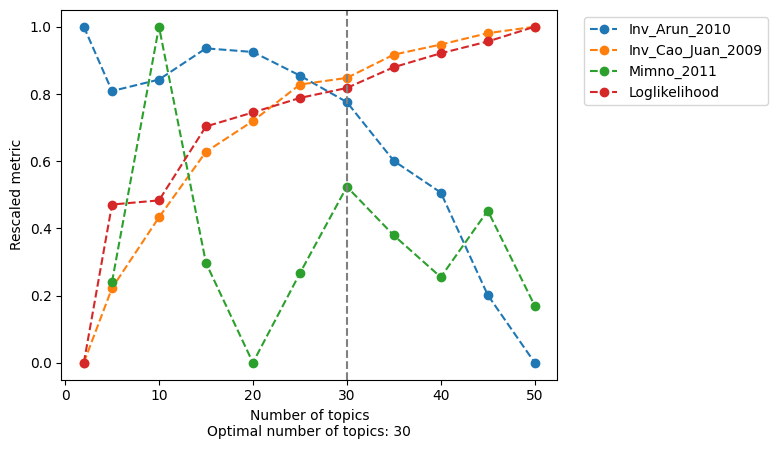

In [12]:
from pycisTopic.lda_models import evaluate_models
model = evaluate_models(
    models,
    select_model = None, # Returns best in models list based on all metrics, Minmo is usually best
    return_model = True
)

In [13]:
model.metrics

,Arun_2010,Cao_Juan_2009,Mimno_2011,loglikelihood
Metric,0.146958,0.223759,-1.311545,5.608772e+07


In [14]:
cleaned_cistopic_obj.add_LDA_model(model)

In [15]:
#cleaned_cistopic_obj.cell_data = cleaned_cistopic_obj.cell_data.dropna()
cleaned_cistopic_obj.cell_data

,cisTopic_nr_frag,cisTopic_log_nr_frag,cisTopic_nr_acc,cisTopic_log_nr_acc,sample_id,barcode_rank,total_fragments_count,log10_total_fragments_count,unique_fragments_count,log10_unique_fragments_count,...,pdf_values_for_tss_enrichment,pdf_values_for_fraction_of_fragments_in_peaks,pdf_values_for_duplication_ratio,barcode,n_genes_by_counts,total_counts,celltype_leiden,dataset,Doublet_scores_fragments,Predicted_doublets_fragments
TAGGTGTCAGATAAGT-1_ATAC_NOA1,8666,3.937819,7715,3.887336,ATAC_NOA1,55,18306,4.262617,18306,4.262617,...,0.000626,0.037838,6527.938476,TAGGTGTCAGATAAGT-1,5673.0,12722.0,Macrophage,ATAC_NOA1,0.106466,False
GTGGATTAGGTGTTGG-1_ATAC_NOA1,6751,3.829368,6108,3.785899,ATAC_NOA1,641,11508,4.061038,11508,4.061038,...,0.002023,0.237566,13031.374667,GTGGATTAGGTGTTGG-1,4729.0,10263.0,Sertoli,ATAC_NOA1,0.181043,False
CTTCTAATCTAGCAGT-1_ATAC_NOA1,4929,3.692759,4438,3.647187,ATAC_NOA1,1024,10305,4.013090,10305,4.013090,...,0.005275,0.197100,22171.183555,CTTCTAATCTAGCAGT-1,3029.0,6694.0,Myoid,ATAC_NOA1,0.131876,False
TACTGCCCAAGGATGC-1_ATAC_NOA1,3163,3.500099,2974,3.473341,ATAC_NOA1,4322,6125,3.787177,6125,3.787177,...,0.001225,0.406095,28620.279546,TACTGCCCAAGGATGC-1,2358.0,4780.0,Leydig,ATAC_NOA1,0.085616,False
TTACTCACAGCTTACA-1_ATAC_NOA1,3365,3.526985,3138,3.496653,ATAC_NOA1,4957,5663,3.753123,5663,3.753123,...,0.001055,0.508570,28280.935554,TTACTCACAGCTTACA-1,2527.0,5245.0,Leydig,ATAC_NOA1,0.075212,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
GGGTTATCAATTGGCT-1_ATAC_OA2,1248,3.096215,1226,3.08849,ATAC_OA2,13984,2866,3.457428,2866,3.457428,...,0.002109,0.243601,59345.966310,GGGTTATCAATTGGCT-1,893.0,1748.0,Sertoli,ATAC_OA2,0.082867,False
TCCAGAAAGTGGGACT-1_ATAC_OA2,1629,3.211921,1574,3.197005,ATAC_OA2,11247,3170,3.501196,3170,3.501196,...,0.003184,0.146076,36718.520370,TCCAGAAAGTGGGACT-1,1143.0,2284.0,PreLeptotene.SC,ATAC_OA2,0.163158,False
CCTAAAGGTGCGTAGA-1_ATAC_OA2,1304,3.115278,1281,3.107549,ATAC_OA2,19731,2493,3.396896,2493,3.396896,...,0.003815,0.076102,54743.100143,CCTAAAGGTGCGTAGA-1,777.0,1506.0,Diplotene.SC,ATAC_OA2,0.106466,False
TTACGTTAGGTTGTGG-1_ATAC_OA2,1154,3.062206,1131,3.053463,ATAC_OA2,17154,2630,3.420121,2630,3.420121,...,0.002495,0.207087,71514.269544,TTACGTTAGGTTGTGG-1,843.0,1622.0,Early.Round.SD,ATAC_OA2,0.085616,False


In [16]:
pickle.dump(
    cleaned_cistopic_obj,
    open(os.path.join(out_dir, "final_cistopic_obj.pkl"), "wb")
)

In [81]:
with open(os.path.join(out_dir, "final_cistopic_obj.pkl"), "rb") as f:
    cistopic_obj = pickle.load(f)

In [18]:
cistopic_obj.cell_data.isna().sum()

cisTopic_nr_frag                                 0
cisTopic_log_nr_frag                             0
cisTopic_nr_acc                                  0
cisTopic_log_nr_acc                              0
sample_id                                        0
barcode_rank                                     0
total_fragments_count                            0
log10_total_fragments_count                      0
unique_fragments_count                           0
log10_unique_fragments_count                     0
total_fragments_in_peaks_count                   0
log10_total_fragments_in_peaks_count             0
unique_fragments_in_peaks_count                  0
log10_unique_fragments_in_peaks_count            0
fraction_of_fragments_in_peaks                   0
duplication_count                                0
duplication_ratio                                0
nucleosome_signal                                0
tss_enrichment                                   0
pdf_values_for_tss_enrichment  

In [18]:
from pycisTopic.clust_vis import (
    find_clusters,
    run_umap,
    run_tsne,
    plot_metadata,
    plot_topic,
    cell_topic_heatmap
)

In [80]:
cistopic_obj.projections

{'cell': {'UMAP':                                 UMAP_1     UMAP_2
  TAGGTGTCAGATAAGT-1_ATAC_NOA1 -4.434816  -3.185730
  GTGGATTAGGTGTTGG-1_ATAC_NOA1 -4.540209   2.775114
  CTTCTAATCTAGCAGT-1_ATAC_NOA1 -4.563591  -1.329303
  TACTGCCCAAGGATGC-1_ATAC_NOA1 -5.076515  -3.232430
  TTACTCACAGCTTACA-1_ATAC_NOA1 -4.647852   1.392543
  ...                                ...        ...
  GGGTTATCAATTGGCT-1_ATAC_OA2   0.071490  -4.401985
  TCCAGAAAGTGGGACT-1_ATAC_OA2   5.641675  -9.023922
  CCTAAAGGTGCGTAGA-1_ATAC_OA2   7.934659  12.543470
  TTACGTTAGGTTGTGG-1_ATAC_OA2  -4.220186  -3.189695
  TTGCTATGTTCCGGCA-1_ATAC_OA2  -4.523751   3.127230
  
  [20803 rows x 2 columns],
  'tSNE':                                  tSNE_1     tSNE_2
  TAGGTGTCAGATAAGT-1_ATAC_NOA1  25.075151 -58.227764
  GTGGATTAGGTGTTGG-1_ATAC_NOA1  82.908142 -21.350050
  CTTCTAATCTAGCAGT-1_ATAC_NOA1  57.132248 -53.229393
  TACTGCCCAAGGATGC-1_ATAC_NOA1  32.767773 -65.830536
  TTACTCACAGCTTACA-1_ATAC_NOA1  79.335487 -33.811127
  .

In [83]:
find_clusters(
    cistopic_obj,
    target  = 'cell',
    k = 10,
    res = [0.6, 1.2, 3],
    prefix = 'pycisTopic_',
    scale = True,
    split_pattern = '_'
)

2025-12-17 12:59:32,001 cisTopic     INFO     Finding neighbours
Columns ['pycisTopic_leiden_10_0.6'] will be overwritten
Columns ['pycisTopic_leiden_10_1.2'] will be overwritten
Columns ['pycisTopic_leiden_10_3'] will be overwritten


In [31]:
run_umap(
    cistopic_obj,
    target  = 'cell', 
    scale=True
)

2025-12-17 10:45:25,473 cisTopic     INFO     Running UMAP


/home/jool/miniforge3/envs/cistopic/lib/python3.11/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


In [85]:
run_tsne(
    cistopic_obj,
    target  = 'cell', 
    scale=True
)

2025-12-17 13:06:23,288 cisTopic     INFO     Running TSNE


In [86]:
cistopic_obj.projections

{'cell': {'UMAP':                                 UMAP_1     UMAP_2
  TAGGTGTCAGATAAGT-1_ATAC_NOA1 -4.434816  -3.185730
  GTGGATTAGGTGTTGG-1_ATAC_NOA1 -4.540209   2.775114
  CTTCTAATCTAGCAGT-1_ATAC_NOA1 -4.563591  -1.329303
  TACTGCCCAAGGATGC-1_ATAC_NOA1 -5.076515  -3.232430
  TTACTCACAGCTTACA-1_ATAC_NOA1 -4.647852   1.392543
  ...                                ...        ...
  GGGTTATCAATTGGCT-1_ATAC_OA2   0.071490  -4.401985
  TCCAGAAAGTGGGACT-1_ATAC_OA2   5.641675  -9.023922
  CCTAAAGGTGCGTAGA-1_ATAC_OA2   7.934659  12.543470
  TTACGTTAGGTTGTGG-1_ATAC_OA2  -4.220186  -3.189695
  TTGCTATGTTCCGGCA-1_ATAC_OA2  -4.523751   3.127230
  
  [20803 rows x 2 columns],
  'tSNE':                                  tSNE_1     tSNE_2
  TAGGTGTCAGATAAGT-1_ATAC_NOA1  25.075151 -58.227764
  GTGGATTAGGTGTTGG-1_ATAC_NOA1  82.908142 -21.350050
  CTTCTAATCTAGCAGT-1_ATAC_NOA1  57.132248 -53.229393
  TACTGCCCAAGGATGC-1_ATAC_NOA1  32.767773 -65.830536
  TTACTCACAGCTTACA-1_ATAC_NOA1  79.335487 -33.811127
  .

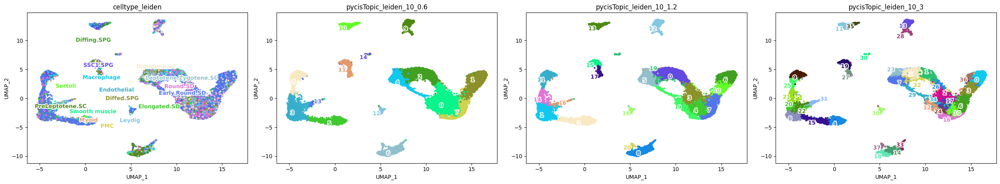

In [87]:
plot_metadata(
    cistopic_obj,
    reduction_name='UMAP',
    variables=['celltype_leiden', 'pycisTopic_leiden_10_0.6', 'pycisTopic_leiden_10_1.2', 'pycisTopic_leiden_10_3'],
    target='cell', num_columns=4,
    text_size=10,
    dot_size=5
)

In [88]:
annot_dict = {}
for resolution in [0.6, 1.2, 3]:
    annot_dict[f"pycisTopic_leiden_10_{resolution}"] = {}
    for cluster in set(cistopic_obj.cell_data[f"pycisTopic_leiden_10_{resolution}"]):
        counts = cistopic_obj.cell_data.loc[cistopic_obj.cell_data.loc[cistopic_obj.cell_data[f"pycisTopic_leiden_10_{resolution}"] == cluster].index, "celltype_leiden"].value_counts()
        annot_dict[f"pycisTopic_leiden_10_{resolution}"][cluster] = f"{counts.index[counts.argmax()]}({cluster})"

In [89]:
for resolution in [0.6, 1.2, 3]:
    cistopic_obj.cell_data[f'pycisTopic_leiden_10_{resolution}'] = [
        annot_dict[f'pycisTopic_leiden_10_{resolution}'][x] for x in cistopic_obj.cell_data[f'pycisTopic_leiden_10_{resolution}'].tolist()
    ]

In [90]:
cistopic_obj.cell_data

,log10_unique_fragments_count,nucleosome_signal,fraction_of_fragments_in_peaks,duplication_count,log10_unique_fragments_in_peaks_count,pycisTopic_leiden_10_1.2,log10_total_fragments_count,total_fragments_in_peaks_count,cisTopic_log_nr_acc,duplication_ratio,...,unique_fragments_count,log10_total_fragments_in_peaks_count,celltype_leiden,barcode_rank,cisTopic_log_nr_frag,cisTopic_nr_frag,unique_fragments_in_peaks_count,pdf_values_for_tss_enrichment,pycisTopic_leiden_10_0.6,pycisTopic_leiden_10_3
TAGGTGTCAGATAAGT-1_ATAC_NOA1,4.262617,0.966418,0.457883,0,3.923399,Early.Round.SD(1),4.262617,8382,3.887336,0.0,...,18306,3.923399,Macrophage,55,3.937819,8666,8382,0.000626,Early.Round.SD(3),Early.Round.SD(8)
GTGGATTAGGTGTTGG-1_ATAC_NOA1,4.061038,0.967488,0.565693,0,3.813648,Early.Round.SD(11),4.061038,6510,3.785899,0.0,...,11508,3.813648,Sertoli,641,3.829368,6751,6510,0.002023,Early.Round.SD(8),Early.Round.SD(25)
CTTCTAATCTAGCAGT-1_ATAC_NOA1,4.013090,1.275896,0.460359,0,3.676236,Early.Round.SD(1),4.013090,4744,3.647187,0.0,...,10305,3.676236,Myoid,1024,3.692759,4929,4744,0.005275,Early.Round.SD(3),Early.Round.SD(20)
TACTGCCCAAGGATGC-1_ATAC_NOA1,3.787177,1.293869,0.496653,0,3.483302,Early.Round.SD(1),3.787177,3042,3.473341,0.0,...,6125,3.483302,Leydig,4322,3.500099,3163,3042,0.001225,Early.Round.SD(3),Early.Round.SD(8)
TTACTCACAGCTTACA-1_ATAC_NOA1,3.753123,1.005629,0.572665,0,3.511081,Early.Round.SD(14),3.753123,3243,3.496653,0.0,...,5663,3.511081,Leydig,4957,3.526985,3365,3243,0.001055,Early.Round.SD(8),Early.Round.SD(21)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
GGGTTATCAATTGGCT-1_ATAC_OA2,3.457428,1.074277,0.424285,0,3.085291,Early.Round.SD(2),3.457428,1216,3.08849,0.0,...,2866,3.085291,Sertoli,13984,3.096215,1248,1216,0.002109,Early.Round.SD(5),Early.Round.SD(4)
TCCAGAAAGTGGGACT-1_ATAC_OA2,3.501196,0.776628,0.502524,0,3.202488,Leydig(8),3.501196,1593,3.197005,0.0,...,3170,3.202488,PreLeptotene.SC,11247,3.211921,1629,1593,0.003184,Leydig(6),Leydig(14)
CCTAAAGGTGCGTAGA-1_ATAC_OA2,3.396896,0.755401,0.507020,0,3.102091,Diplotene.SC(12),3.396896,1264,3.107549,0.0,...,2493,3.102091,Diplotene.SC,19731,3.115278,1304,1264,0.003815,Diplotene.SC(9),Diplotene.SC(13)
TTACGTTAGGTTGTGG-1_ATAC_OA2,3.420121,0.868585,0.424715,0,3.048442,Early.Round.SD(1),3.420121,1117,3.053463,0.0,...,2630,3.048442,Early.Round.SD,17154,3.062206,1154,1117,0.002495,Early.Round.SD(3),Early.Round.SD(8)


In [38]:
pickle.dump(
    cistopic_obj,
    open(os.path.join(out_dir, "final_cistopic_obj.pkl"), "wb")
)

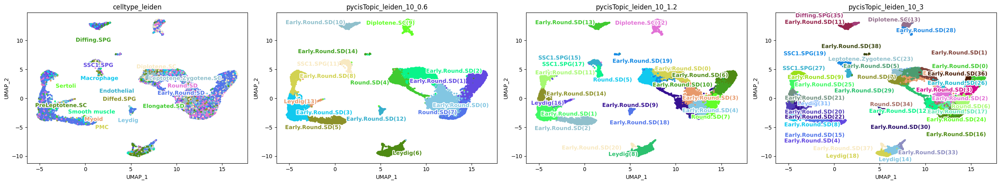

In [39]:
plot_metadata(
    cistopic_obj,
    reduction_name='UMAP',
    variables=['celltype_leiden', 'pycisTopic_leiden_10_0.6', 'pycisTopic_leiden_10_1.2', 'pycisTopic_leiden_10_3'],
    target='cell', num_columns=4,
    text_size=10,
    dot_size=5)

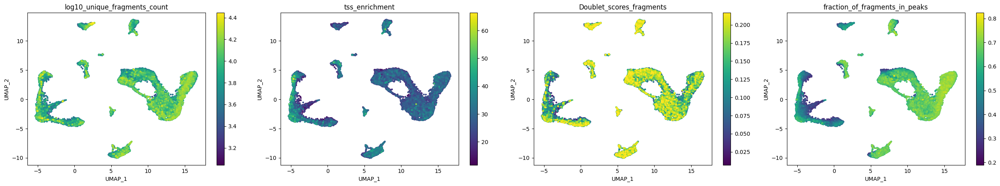

In [40]:
plot_metadata(
    cistopic_obj,
    reduction_name='UMAP',
    variables=['log10_unique_fragments_count', 'tss_enrichment', 'Doublet_scores_fragments', 'fraction_of_fragments_in_peaks'],
    target='cell', num_columns=4,
    text_size=10,
    dot_size=5)

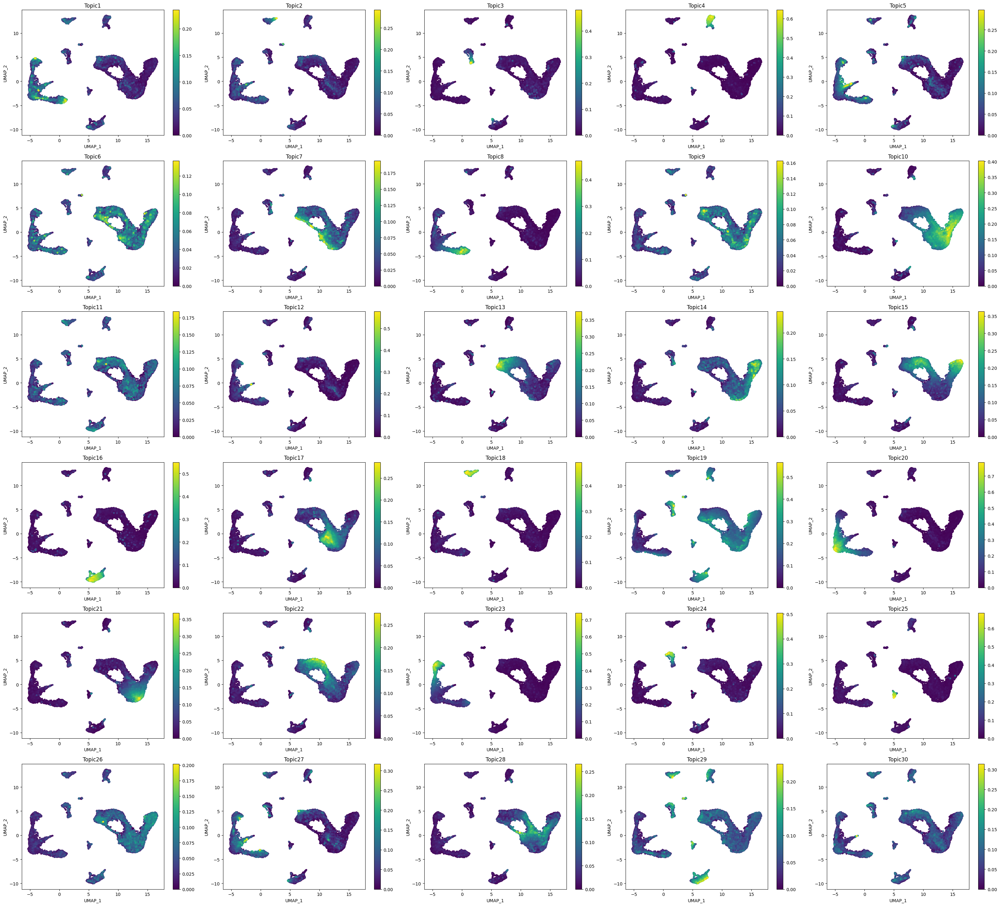

In [41]:
plot_topic(
    cistopic_obj,
    reduction_name = 'UMAP',
    target = 'cell',
    num_columns=5
)

In [48]:
cistopic_obj.cell_data["celltype_leiden"].cat.categories

Index(['Diffed.SPG', 'Diffing.SPG', 'Diplotene.SC', 'Early.Round.SD',
       'Elongated.SD', 'Endothelial', 'Leptotene.Zygotene.SC', 'Leydig',
       'Macrophage', 'Myoid', 'PMC', 'PreLeptotene.SC', 'Round.SD', 'SSC1.SPG',
       'Sertoli', 'Smooth muscle'],
      dtype='object')

In [12]:
with open(os.path.join(out_dir, "final_cistopic_obj.pkl"), "rb") as f:
    cistopic_obj = pickle.load(f)

In [94]:
cd = cistopic_obj.cell_data.copy()
cd["celltype_leiden"] = cd["celltype_leiden"].astype(str)
cistopic_obj.cell_data = cd

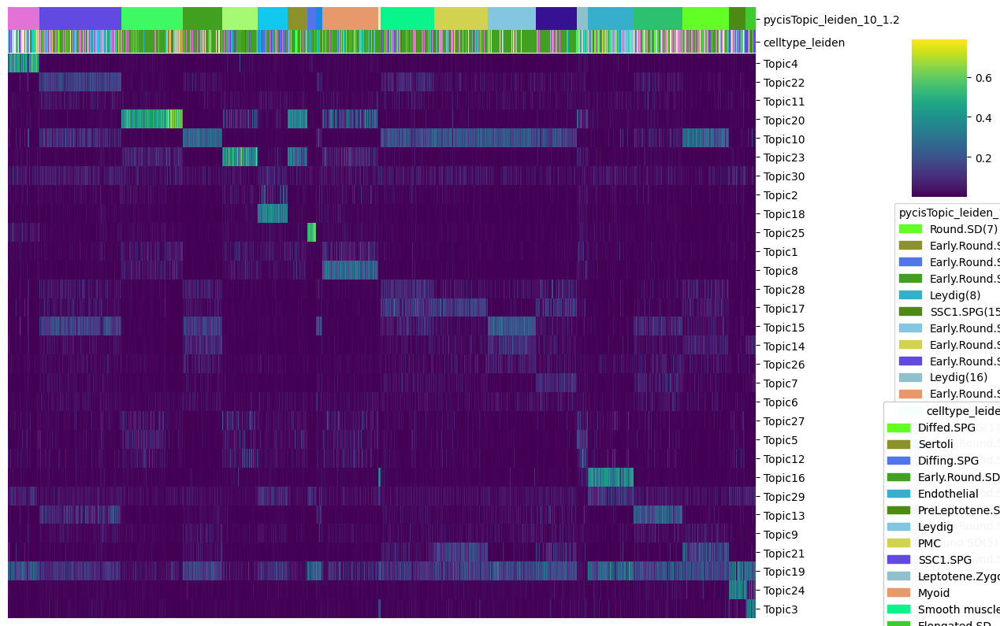

In [95]:
cell_topic_heatmap(
    cistopic_obj,
    variables = ['pycisTopic_leiden_10_1.2', 'celltype_leiden'],
    scale = False,
    legend_loc_x = 1.0,
    legend_loc_y = -1.2,
    legend_dist_y = -1,
    figsize = (14, 10)
)

In [96]:
from pycisTopic.topic_binarization import *

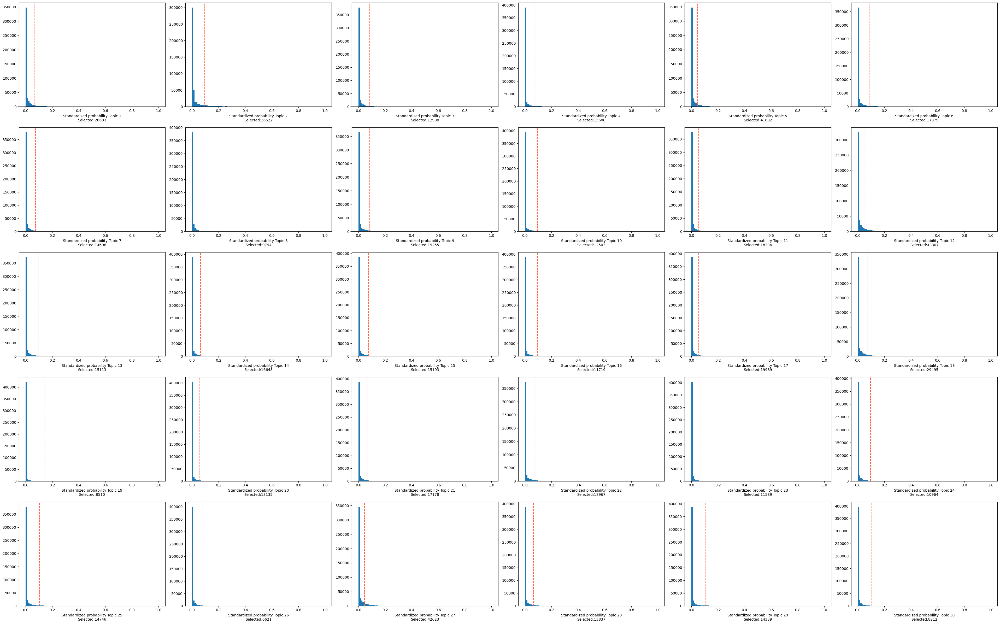

In [97]:
region_bin_topics_otsu = binarize_topics(cistopic_obj, method='otsu', plot = True, num_columns = 6)

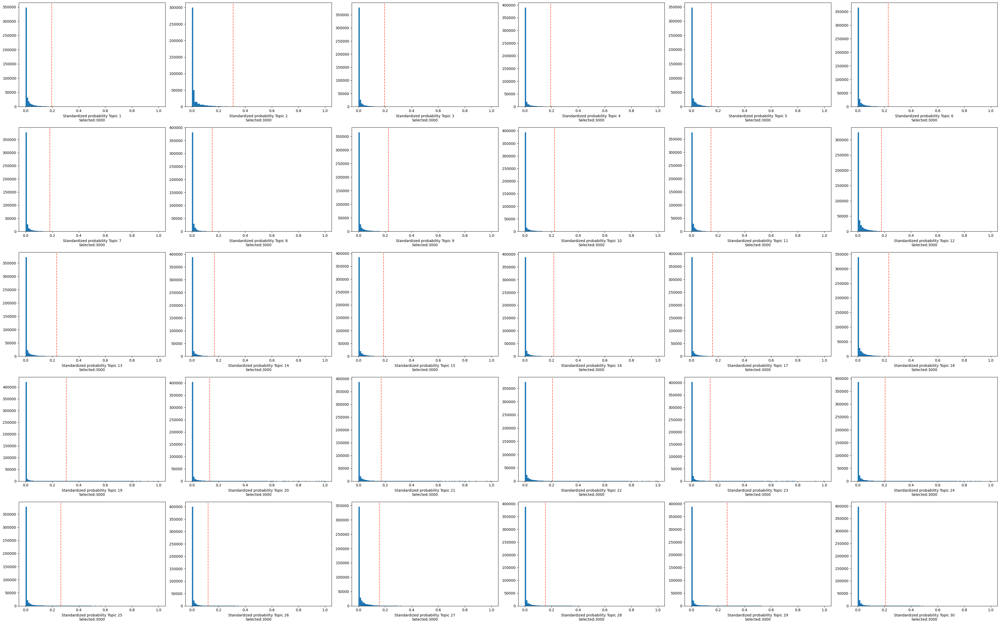

In [98]:
region_bin_topics_top_3k = binarize_topics(cistopic_obj, method='ntop', ntop = 3000, plot = True, num_columns = 6)

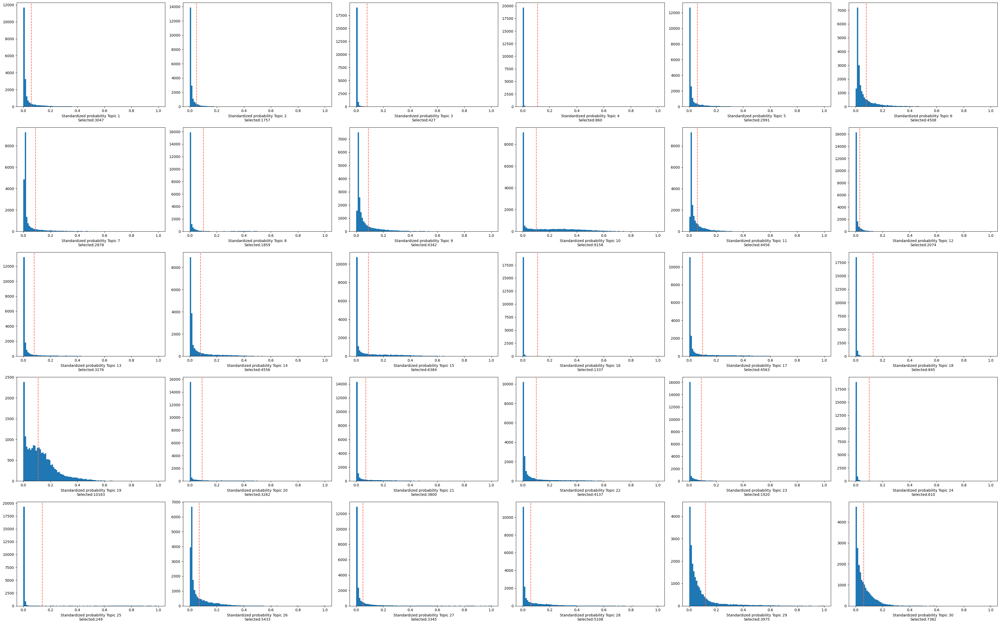

In [99]:
binarized_cell_topic = binarize_topics(
    cistopic_obj,
    target='cell',
    method='li',
    plot=True,
    num_columns=6, nbins=100)

In [100]:
from pycisTopic.topic_qc import compute_topic_metrics, plot_topic_qc, topic_annotation
import matplotlib.pyplot as plt
from pycisTopic.utils import fig2img

In [101]:
topic_qc_metrics = compute_topic_metrics(cistopic_obj)

In [102]:
fig_dict={}
fig_dict['CoherenceVSAssignments']=plot_topic_qc(topic_qc_metrics, var_x='Coherence', var_y='Log10_Assignments', var_color='Gini_index', plot=False, return_fig=True)
fig_dict['AssignmentsVSCells_in_bin']=plot_topic_qc(topic_qc_metrics, var_x='Log10_Assignments', var_y='Cells_in_binarized_topic', var_color='Gini_index', plot=False, return_fig=True)
fig_dict['CoherenceVSCells_in_bin']=plot_topic_qc(topic_qc_metrics, var_x='Coherence', var_y='Cells_in_binarized_topic', var_color='Gini_index', plot=False, return_fig=True)
fig_dict['CoherenceVSRegions_in_bin']=plot_topic_qc(topic_qc_metrics, var_x='Coherence', var_y='Regions_in_binarized_topic', var_color='Gini_index', plot=False, return_fig=True)
fig_dict['CoherenceVSMarginal_dist']=plot_topic_qc(topic_qc_metrics, var_x='Coherence', var_y='Marginal_topic_dist', var_color='Gini_index', plot=False, return_fig=True)
fig_dict['CoherenceVSGini_index']=plot_topic_qc(topic_qc_metrics, var_x='Coherence', var_y='Gini_index', var_color='Gini_index', plot=False, return_fig=True)

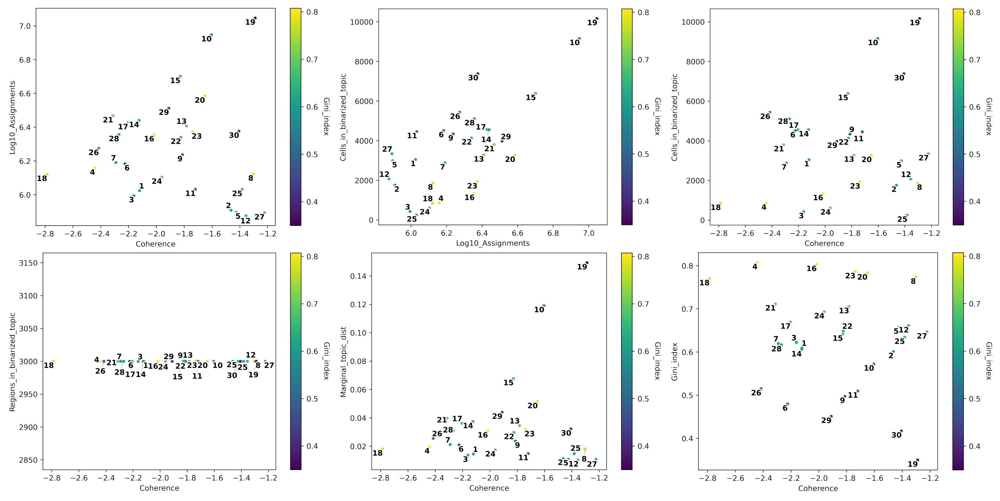

In [103]:
# Plot topic stats in one figure
fig=plt.figure(figsize=(40, 43))
i = 1
for fig_ in fig_dict.keys():
    plt.subplot(2, 3, i)
    img = fig2img(fig_dict[fig_]) #To convert figures to png to plot together, see .utils.py. This converts the figure to png.
    plt.imshow(img)
    plt.axis('off')
    i += 1
plt.subplots_adjust(wspace=0, hspace=-0.70)
plt.show()

In [104]:
#Annotate topics for celltypes
topic_annot = topic_annotation(
    cistopic_obj,
    annot_var='celltype_leiden',
    binarized_cell_topic=binarized_cell_topic,
    general_topic_thr = 0.2
)
topic_annot

/home/jool/miniforge3/envs/cistopic/lib/python3.11/site-packages/statsmodels/stats/weightstats.py:792: RuntimeWarning: divide by zero encountered in scalar divide
  zstat = value / std


,celltype_leiden,Ratio_cells_in_topic,Ratio_group_in_population,is_general
Topic1,"Sertoli, Diffed.SPG, Endothelial, PreLeptotene...",0.146469,0.26376,False
Topic2,"Diffed.SPG, Diffing.SPG, PreLeptotene.SC, SSC1...",0.084459,0.11705,False
Topic3,"Diffed.SPG, PreLeptotene.SC, Leydig, SSC1.SPG,...",0.020526,0.180503,False
Topic4,"Diffed.SPG, SSC1.SPG, Macrophage, Diplotene.SC",0.04134,0.158583,False
Topic5,"Sertoli, Early.Round.SD, Myoid, Smooth muscle",0.143777,0.483776,False
Topic6,"Early.Round.SD, Elongated.SD, Round.SD",0.2167,0.596452,False
Topic7,"Diffing.SPG, Early.Round.SD, Leptotene.Zygoten...",0.138345,0.641494,False
Topic8,"Sertoli, Diffed.SPG, Early.Round.SD, Endotheli...",0.089362,0.528145,False
Topic9,"Diffing.SPG, Early.Round.SD, Leptotene.Zygoten...",0.20872,0.641494,False
Topic10,"Early.Round.SD, Elongated.SD, Diplotene.SC, Ro...",0.440225,0.651829,False


In [105]:
from pycisTopic.diff_features import (
    impute_accessibility,
    normalize_scores,
    find_highly_variable_features,
    find_diff_features
)

In [106]:
imputed_acc_obj = impute_accessibility(
    cistopic_obj,
    selected_cells=None,
    selected_regions=None,
    scale_factor=10**6
)

2025-12-17 13:46:02,146 cisTopic     INFO     Imputing region accessibility
2025-12-17 13:46:02,156 cisTopic     INFO     Impute region accessibility for regions 0-20000
2025-12-17 13:46:03,761 cisTopic     INFO     Impute region accessibility for regions 20000-40000
2025-12-17 13:46:05,639 cisTopic     INFO     Impute region accessibility for regions 40000-60000
2025-12-17 13:46:07,169 cisTopic     INFO     Impute region accessibility for regions 60000-80000
2025-12-17 13:46:08,787 cisTopic     INFO     Impute region accessibility for regions 80000-100000
2025-12-17 13:46:10,328 cisTopic     INFO     Impute region accessibility for regions 100000-120000
2025-12-17 13:46:11,761 cisTopic     INFO     Impute region accessibility for regions 120000-140000
2025-12-17 13:46:13,402 cisTopic     INFO     Impute region accessibility for regions 140000-160000
2025-12-17 13:46:15,090 cisTopic     INFO     Impute region accessibility for regions 160000-180000
2025-12-17 13:46:16,811 cisTopic     

In [107]:
normalized_imputed_acc_obj = normalize_scores(imputed_acc_obj, scale_factor=10**4)

2025-12-17 13:46:39,642 cisTopic     INFO     Normalizing imputed data
2025-12-17 13:47:15,195 cisTopic     INFO     Done!


2025-12-17 13:47:15,244 cisTopic     INFO     Calculating mean
2025-12-17 13:47:19,999 cisTopic     INFO     Calculating variance


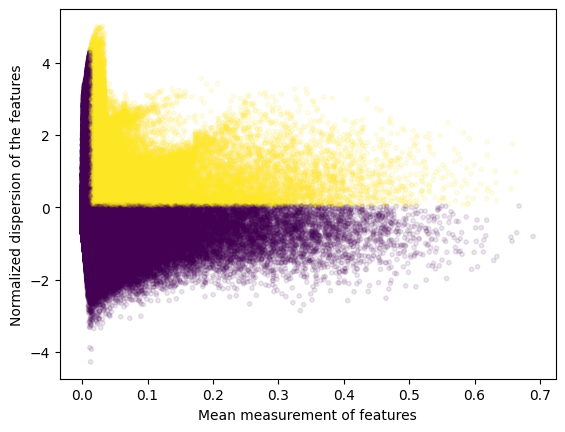

2025-12-17 13:47:57,183 cisTopic     INFO     Done!


In [108]:
variable_regions = find_highly_variable_features(
    normalized_imputed_acc_obj,
    min_disp = 0.05,
    min_mean = 0.0125,
    max_mean = 3,
    max_disp = np.inf,
    n_bins=20,
    n_top_features=None,
    plot=True
)

In [109]:
len(variable_regions)

66545

In [112]:
markers_dict= find_diff_features(
    cistopic_obj,
    imputed_acc_obj,
    variable='celltype_leiden',
    var_features=variable_regions,
    contrasts=None,
    adjpval_thr=0.05,
    log2fc_thr=np.log2(1.5),
    n_cpu=1,
    _temp_dir="/home/jool/temp",
    split_pattern = '_'
)

2025-12-17 13:55:46,210 cisTopic     INFO     Subsetting data for Diffed.SPG (499 of 20803)
2025-12-17 13:55:54,385 cisTopic     INFO     Computing p-value for Diffed.SPG
2025-12-17 13:57:29,018 cisTopic     INFO     Computing log2FC for Diffed.SPG
2025-12-17 13:57:33,957 cisTopic     INFO     Diffed.SPG done!
2025-12-17 13:57:34,038 cisTopic     INFO     Subsetting data for Diffing.SPG (298 of 20803)
2025-12-17 13:57:36,789 cisTopic     INFO     Computing p-value for Diffing.SPG
2025-12-17 13:59:15,032 cisTopic     INFO     Computing log2FC for Diffing.SPG
2025-12-17 13:59:16,566 cisTopic     INFO     Diffing.SPG done!
2025-12-17 13:59:16,626 cisTopic     INFO     Subsetting data for Diplotene.SC (1152 of 20803)
2025-12-17 13:59:19,437 cisTopic     INFO     Computing p-value for Diplotene.SC
2025-12-17 14:00:44,555 cisTopic     INFO     Computing log2FC for Diplotene.SC
2025-12-17 14:00:45,994 cisTopic     INFO     Diplotene.SC done!
2025-12-17 14:00:46,049 cisTopic     INFO     Subse

In [113]:
from pycisTopic.clust_vis import plot_imputed_features

In [114]:
plot_imputed_features(
    cistopic_obj,
    reduction_name='UMAP',
    imputed_data=imputed_acc_obj,
    features=[markers_dict[x].index.tolist()[0] for x in ['BG', 'GC', 'INH_SST', 'COP']],
    scale=False,
    num_columns=4
)

KeyError: 'BG'

In [115]:
#Save candidate enhancers region sets
os.makedirs(os.path.join(out_dir, "region_sets"), exist_ok = True)
os.makedirs(os.path.join(out_dir, "region_sets", "Topics_otsu"), exist_ok = True)
os.makedirs(os.path.join(out_dir, "region_sets", "Topics_top_3k"), exist_ok = True)
os.makedirs(os.path.join(out_dir, "region_sets", "DARs_cell_type"), exist_ok = True)


In [116]:
from pycisTopic.utils import region_names_to_coordinates

In [117]:
for topic in region_bin_topics_otsu:
    region_names_to_coordinates(
        region_bin_topics_otsu[topic].index
    ).sort_values(
        ["Chromosome", "Start", "End"]
    ).to_csv(
        os.path.join(out_dir, "region_sets", "Topics_otsu", f"{topic}.bed"),
        sep = "\t",
        header = False, index = False
    )

In [118]:
for topic in region_bin_topics_top_3k:
    region_names_to_coordinates(
        region_bin_topics_top_3k[topic].index
    ).sort_values(
        ["Chromosome", "Start", "End"]
    ).to_csv(
        os.path.join(out_dir, "region_sets", "Topics_top_3k", f"{topic}.bed"),
        sep = "\t",
        header = False, index = False
    )

In [119]:
for cell_type in markers_dict:
    region_names_to_coordinates(
        markers_dict[cell_type].index
    ).sort_values(
        ["Chromosome", "Start", "End"]
    ).to_csv(
        os.path.join(out_dir, "region_sets", "DARs_cell_type", f"{cell_type}.bed"),
        sep = "\t",
        header = False, index = False
    )

In [120]:
import pyranges as pr
from pycisTopic.gene_activity import get_gene_activity

In [121]:
chromsizes = pd.read_table(os.path.join(data_dir, "hg38.chrom_sizes_and_alias.tsv"))

In [122]:
chromsizes.rename({"# ucsc": "Chromosome", "length": "End"}, axis = 1, inplace = True)
chromsizes["Start"] = 0
chromsizes = pr.PyRanges(chromsizes[["Chromosome", "Start", "End"]])

In [123]:
chromsizes

,Chromosome,Start,End
0,chr1,0,248956422
1,chr1_GL383518v1_alt,0,182439
2,chr1_GL383519v1_alt,0,110268
3,chr1_GL383520v2_alt,0,366580
4,chr1_KI270706v1_random,0,175055
...,...,...,...
449,chrX_KI270880v1_alt,0,284869
450,chrX_KI270881v1_alt,0,144206
451,chrX_KI270913v1_alt,0,274009
452,chrY,0,57227415


In [124]:
pr_annotation = pd.read_table(
        os.path.join(out_dir, "qc", "tss.bed")
    ).rename(
        {"Name": "Gene", "# Chromosome": "Chromosome"}, axis = 1)
pr_annotation["Transcription_Start_Site"] = pr_annotation["Start"]
pr_annotation = pr.PyRanges(pr_annotation)
pr_annotation

,Chromosome,Start,End,Gene,Score,Strand,Transcript_type,Transcription_Start_Site
0,GL000009.2,58375,58376,NaN,.,-,protein_coding,58375
1,GL000194.1,115017,115018,NaN,.,-,protein_coding,115017
2,GL000194.1,115054,115055,MAFIP,.,-,protein_coding,115054
3,GL000195.1,49163,49164,NaN,.,-,protein_coding,49163
4,GL000213.1,139654,139655,NaN,.,-,protein_coding,139654
...,...,...,...,...,...,...,...,...
172014,chrY,19744988,19744989,KDM5D,.,-,protein_coding,19744988
172015,chrY,19744948,19744949,KDM5D,.,-,protein_coding,19744948
172016,chrY,19744762,19744763,KDM5D,.,-,protein_coding,19744762
172017,chrY,19744742,19744743,KDM5D,.,-,protein_coding,19744742


In [125]:
gene_act, weigths = get_gene_activity(
    imputed_acc_obj,
    pr_annotation,
    chromsizes,
    use_gene_boundaries=True, # Whether to use the whole search space or stop when encountering another gene
    upstream=[1000, 100000], # Search space upstream. The minimum means that even if there is a gene right next to it
                             # these bp will be taken (1kbp here)
    downstream=[1000,100000], # Search space downstream
    distance_weight=True, # Whether to add a distance weight (an exponential function, the weight will decrease with distance)
    decay_rate=1, # Exponent for the distance exponential funciton (the higher the faster will be the decrease)
    extend_gene_body_upstream=10000, # Number of bp upstream immune to the distance weight (their value will be maximum for
                          #this weight)
    extend_gene_body_downstream=500, # Number of bp downstream immune to the distance weight
    gene_size_weight=False, # Whether to add a weights based on the length of the gene
    gene_size_scale_factor='median', # Dividend to calculate the gene size weigth. Default is the median value of all genes
                          #in the genome
    remove_promoters=False, # Whether to remove promoters when computing gene activity scores
    average_scores=True, # Whether to divide by the total number of region assigned to a gene when calculating the gene
                          #activity score
    scale_factor=1, # Value to multiply for the final gene activity matrix
    extend_tss=[10,10], # Space to consider a promoter
    gini_weight = True, # Whether to add a gini index weigth. The more unique the region is, the higher this weight will be
    return_weights= True, # Whether to return the final weights
    project='Gene_activity') # Project name for the gene activity object

2025-12-17 14:22:51,154 cisTopic     INFO     Calculating gene boundaries
2025-12-17 14:23:01,375 cisTopic     INFO     Calculating distances


join: Strand data from other will be added as strand data to self.
If this is undesired use the flag apply_strand_suffix=False.
To turn off the warning set apply_strand_suffix to True or False.


2025-12-17 14:23:10,661 cisTopic     INFO     Calculating distance weigths
2025-12-17 14:23:11,070 cisTopic     INFO     Distance weights done
2025-12-17 14:23:11,074 cisTopic     INFO     Calculating gini weights
2025-12-17 14:26:14,187 cisTopic     INFO     Getting gene activity scores
2025-12-17 14:28:28,690 cisTopic     INFO     Creating imputed features object


In [202]:
with open(os.path.join(out_dir, "gene_act.pkl"), "wb") as f:
    pickle.dump(gene_act, f)

In [126]:
DAG_markers_dict= find_diff_features(
    cistopic_obj,
    gene_act,
    variable='celltype_leiden',
    var_features=None,
    contrasts=None,
    adjpval_thr=0.05,
    log2fc_thr=np.log2(1.5),
    n_cpu=1,
    _temp_dir="/home/jool/temp",
    split_pattern = '_')

2025-12-17 14:28:29,560 cisTopic     INFO     Subsetting data for Diffed.SPG (499 of 20803)
2025-12-17 14:28:34,463 cisTopic     INFO     Computing p-value for Diffed.SPG
2025-12-17 14:29:13,670 cisTopic     INFO     Computing log2FC for Diffed.SPG
2025-12-17 14:29:18,400 cisTopic     INFO     Diffed.SPG done!
2025-12-17 14:29:18,460 cisTopic     INFO     Subsetting data for Diffing.SPG (298 of 20803)
2025-12-17 14:29:19,688 cisTopic     INFO     Computing p-value for Diffing.SPG
2025-12-17 14:29:58,912 cisTopic     INFO     Computing log2FC for Diffing.SPG
2025-12-17 14:29:59,359 cisTopic     INFO     Diffing.SPG done!
2025-12-17 14:29:59,407 cisTopic     INFO     Subsetting data for Diplotene.SC (1152 of 20803)
2025-12-17 14:30:00,605 cisTopic     INFO     Computing p-value for Diplotene.SC
2025-12-17 14:30:38,700 cisTopic     INFO     Computing log2FC for Diplotene.SC
2025-12-17 14:30:39,183 cisTopic     INFO     Diplotene.SC done!
2025-12-17 14:30:39,230 cisTopic     INFO     Subse

In [204]:
with open(os.path.join(out_dir, "DAG_markers_dict.pkl"), "wb") as f:
    pickle.dump(DAG_markers_dict, f)

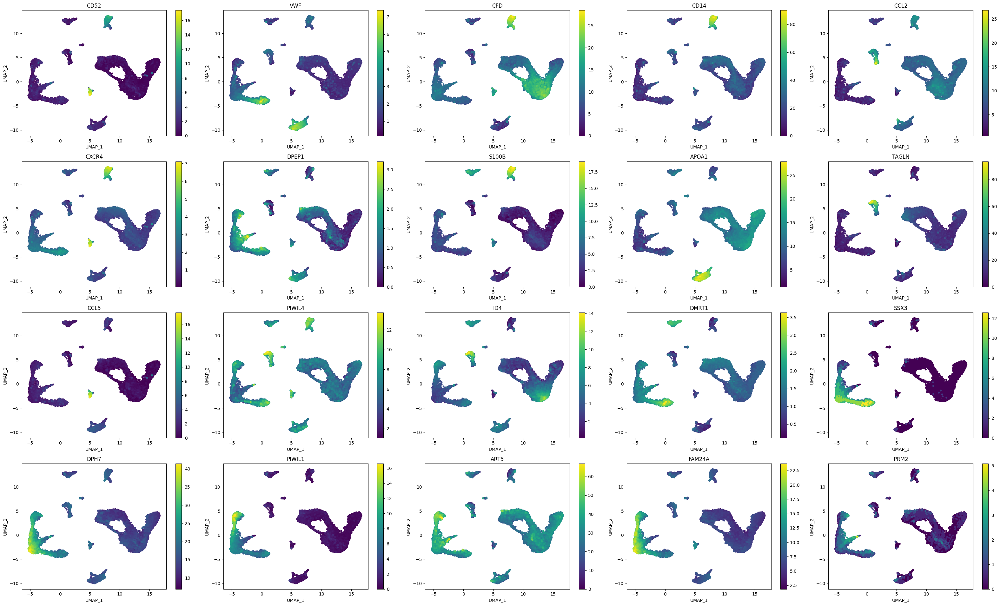

In [171]:
plot_imputed_features(
    cistopic_obj,
    reduction_name='UMAP',
    imputed_data=gene_act,
    features = ['CD52', #B
                'VWF', #endo
                'CFD', #leydig
                'CD14', #macro
                'CCL2', #mast
                'CXCR4', #plasma
                'DPEP1', #PMC
                'S100B', #schwann
                'APOA1', #sertoli
                'TAGLN', #smooth muscle
                'CCL5', #T
                'PIWIL4', #SSC0
                'ID4', #SSC1
                #'ASB9', #SSC2
                'DMRT1', #Diffing
                'SSX3', #Diffed
                'DPH7', #prelep
                #'LINC01120', #lep-zep
                'PIWIL1', #pachytene
                'ART5', #diplotene
                'FAM24A', #early round
                #'TESHL', #LINC01921 #round
                'PRM2', #Elong
    ],

    num_columns=5
)

In [172]:
print("Number of DAGs found:")
print("---------------------")
for x in markers_dict:
    print(f"  {x}: {len(DAG_markers_dict[x])}")

Number of DAGs found:
---------------------
  Diffed.SPG: 865
  Diffing.SPG: 2270
  Diplotene.SC: 732
  Early.Round.SD: 60
  Elongated.SD: 73
  Endothelial: 534
  Leptotene.Zygotene.SC: 107
  Leydig: 528
  Macrophage: 705
  Myoid: 1874
  PMC: 1642
  PreLeptotene.SC: 681
  Round.SD: 45
  SSC1.SPG: 1096
  Sertoli: 3791
  Smooth muscle: 1331


In [4]:
from pycisTopic.label_transfer import label_transfer

/home/jool/miniforge3/envs/cistopic/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
2025-12-18 11:58:29,120	INFO util.py:154 -- Missing packages: ['ipywidgets']. Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.


In [5]:
with open("gene_act.pkl", "rb") as f:
    gene_act = pickle.load(f)


In [ ]:
with open(os.path.join(out_dir, "final_cistopic_obj.pkl"), "rb") as f:
    cistopic_obj = pickle.load(f)

In [4]:
#Built original combined_rna.h5ad with newer version of anndata not in cistopic. So have to remove all 'uns'.
#Only need the raw counts and obs and var for the label transfer, so this is fine.

import h5py

path = "/faststorage/project/projectsInBioinformatics/workspaces/johan/results/combined_rna_duplicate.h5ad"

with h5py.File(path, "r+") as f:
    if "uns" in f:
        keys = list(f["uns"].keys())
        for k in keys:
            del f["uns"][k]


In [6]:
rna_anndata = sc.read_h5ad("/faststorage/project/projectsInBioinformatics/workspaces/johan/results/combined_rna_duplicate.h5ad")
#rna_anndata = ad.AnnData(X=rna_adata.X,
#                        obs = rna_adata.obs.copy(),
#                        var = rna_adata.var.copy())

/home/jool/miniforge3/envs/cistopic/lib/python3.11/site-packages/anndata/_core/anndata.py:1906: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [7]:
rna_anndata.X = rna_anndata.layers['raw_counts'].copy()

In [8]:
rna_anndata

AnnData object with n_obs × n_vars = 28750 × 25464
    obs: 'dataset', 'size_factor', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes', 'leiden', 'Sertoli_score', 'Leydig_score', 'Myoid_score', 'Macrophage_score', 'Endothelial_score', 'B_score', 'Mast_score', 'T_score', 'Plasma_score', 'PMC_score', 'Schwann_score', 'Smooth muscle_score', 'SSC1.SPG_score', 'SSC2.SPG_score', 'Diffing.SPG_score', 'Diffed.SPG_score', 'PreLeptotene.SC_score', 'Leptotene.Zygotene.SC_score', 'Pachytene.SC_score', 'Diplotene.SC_score', 'Early.Round.SD_score', 'Round.SD_score', 'Elongated.SD_score', 'celltype_leiden'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'filter_counts', 'normalised', 'raw_counts'
    obsp: 'connectivities', 'distances'

In [9]:
atac_anndata = ad.AnnData(gene_act.mtx.T, obs = pd.DataFrame(index = gene_act.cell_names), var = pd.DataFrame(index = gene_act.feature_names))

In [10]:
atac_anndata

AnnData object with n_obs × n_vars = 20803 × 17911

In [13]:
rna_anndata.obs["sample_id"] = rna_anndata.obs["dataset"]
atac_anndata.obs["sample_id"] = cistopic_obj.cell_data.sample_id

In [29]:
cistopic_obj.cell_data.sample_id

TAGGTGTCAGATAAGT-1_ATAC_NOA1    ATAC_NOA1
GTGGATTAGGTGTTGG-1_ATAC_NOA1    ATAC_NOA1
CTTCTAATCTAGCAGT-1_ATAC_NOA1    ATAC_NOA1
TACTGCCCAAGGATGC-1_ATAC_NOA1    ATAC_NOA1
TTACTCACAGCTTACA-1_ATAC_NOA1    ATAC_NOA1
                                  ...    
GGGTTATCAATTGGCT-1_ATAC_OA2      ATAC_OA2
TCCAGAAAGTGGGACT-1_ATAC_OA2      ATAC_OA2
CCTAAAGGTGCGTAGA-1_ATAC_OA2      ATAC_OA2
TTACGTTAGGTTGTGG-1_ATAC_OA2      ATAC_OA2
TTGCTATGTTCCGGCA-1_ATAC_OA2      ATAC_OA2
Name: sample_id, Length: 20803, dtype: object

In [14]:
label_dict = label_transfer(
    rna_anndata,
    atac_anndata,
    labels_to_transfer = ['celltype_leiden'],
    variable_genes = True,
    methods = ['harmony', 'bbknn', 'scanorama', 'cca'],
    return_label_weights = False,
    _temp_dir= "/home/jool/temp"
)

2025-12-18 13:14:11,067 cisTopic     INFO     Normalizing RNA data


/home/jool/miniforge3/envs/cistopic/lib/python3.11/site-packages/anndata/_core/anndata.py:1906: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/jool/miniforge3/envs/cistopic/lib/python3.11/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)
/home/jool/miniforge3/envs/cistopic/lib/python3.11/site-packages/anndata/_core/anndata.py:1906: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


2025-12-18 13:15:09,894 cisTopic     INFO     Processing 5 query sample(s) using 1 cpu(s)


2025-12-18 13:15:15,813	INFO worker.py:1724 -- Started a local Ray instance.
(pid=580293) /home/jool/miniforge3/envs/cistopic/lib/python3.11/site-packages/pycisTopic/__init__.py:3: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
(pid=580293)   from pkg_resources import DistributionNotFound, get_distribution


(label_transfer_ray pid=580293) 2025-12-18 13:15:41,650 cisTopic     INFO     Normalizing ATAC data from sample ATAC_NOA2


(label_transfer_ray pid=580293) /home/jool/miniforge3/envs/cistopic/lib/python3.11/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Revieved a view of an AnnData. Making a copy.
(label_transfer_ray pid=580293)   view_to_actual(adata)
(label_transfer_ray pid=580293) /home/jool/miniforge3/envs/cistopic/lib/python3.11/site-packages/pycisTopic/label_transfer.py:241: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
(label_transfer_ray pid=580293)   adata_concat = ref_anndata.concatenate(
(label_transfer_ray pid=580293) /home/jool/miniforge3/envs/cistopic/lib/python3.11/site-packages/anndata/_core/anndata.py:1906: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
(label_transfer_ray pid=580293)   utils.warn_names_duplicates("obs")
(label_transfer_ray pid

(label_transfer_ray pid=580293) 2025-12-18 13:15:56,836 cisTopic     INFO     Running integration with harmony


(label_transfer_ray pid=580293) 2025-12-18 13:16:03,703 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...


(label_transfer_ray pid=580293) 2025-12-18 13:16:03,703 harmonypy    INFO     Computing initial centroids with sklearn.KMeans...


(label_transfer_ray pid=580293) 2025-12-18 13:16:10,059 - harmonypy - INFO - sklearn.KMeans initialization complete.
(label_transfer_ray pid=580293) 2025-12-18 13:16:10,158 - harmonypy - INFO - Iteration 1 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:16:10,059 harmonypy    INFO     sklearn.KMeans initialization complete.
(label_transfer_ray pid=580293) 2025-12-18 13:16:10,158 harmonypy    INFO     Iteration 1 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:16:16,244 - harmonypy - INFO - Iteration 2 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:16:16,244 harmonypy    INFO     Iteration 2 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:16:22,083 - harmonypy - INFO - Iteration 3 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:16:22,083 harmonypy    INFO     Iteration 3 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:16:27,968 - harmonypy - INFO - Iteration 4 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:16:27,968 harmonypy    INFO     Iteration 4 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:16:34,130 - harmonypy - INFO - Iteration 5 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:16:34,130 harmonypy    INFO     Iteration 5 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:16:40,415 - harmonypy - INFO - Iteration 6 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:16:40,415 harmonypy    INFO     Iteration 6 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:16:46,133 - harmonypy - INFO - Iteration 7 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:16:46,133 harmonypy    INFO     Iteration 7 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:16:51,602 - harmonypy - INFO - Iteration 8 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:16:51,602 harmonypy    INFO     Iteration 8 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:16:55,710 - harmonypy - INFO - Iteration 9 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:16:55,710 harmonypy    INFO     Iteration 9 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:17:01,957 - harmonypy - INFO - Iteration 10 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:17:01,957 harmonypy    INFO     Iteration 10 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:17:08,849 - harmonypy - INFO - Stopped before convergence


(label_transfer_ray pid=580293) 2025-12-18 13:17:08,849 harmonypy    INFO     Stopped before convergence


(label_transfer_ray pid=580293) WARNING: consider updating your call to make use of `computation`


(label_transfer_ray pid=580293) 2025-12-18 13:17:09,992 cisTopic     INFO     Running integration with bbknn
(label_transfer_ray pid=580293) 2025-12-18 13:17:36,043 cisTopic     INFO     Running integration with scanorama
(label_transfer_ray pid=580293) Found 1005 genes among all datasets
(label_transfer_ray pid=580293) [[0.         0.32946593]
(label_transfer_ray pid=580293)  [0.         0.        ]]
(label_transfer_ray pid=580293) Processing datasets (0, 1)
(label_transfer_ray pid=580293) 2025-12-18 13:18:01,497 cisTopic     INFO     Running integration with cca
(label_transfer_ray pid=580293) 2025-12-18 13:23:47,510 cisTopic     INFO     Sample ATAC_NOA2 done!
(label_transfer_ray pid=580293) 2025-12-18 13:23:47,540 cisTopic     INFO     Normalizing ATAC data from sample ATAC_OA1


(label_transfer_ray pid=580293) /home/jool/miniforge3/envs/cistopic/lib/python3.11/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Revieved a view of an AnnData. Making a copy.
(label_transfer_ray pid=580293)   view_to_actual(adata)
(label_transfer_ray pid=580293) /home/jool/miniforge3/envs/cistopic/lib/python3.11/site-packages/pycisTopic/label_transfer.py:241: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
(label_transfer_ray pid=580293)   adata_concat = ref_anndata.concatenate(
(label_transfer_ray pid=580293) /home/jool/miniforge3/envs/cistopic/lib/python3.11/site-packages/anndata/_core/anndata.py:1906: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
(label_transfer_ray pid=580293)   utils.warn_names_duplicates("obs")
(label_transfer_ray pid

(label_transfer_ray pid=580293) 2025-12-18 13:23:54,209 cisTopic     INFO     Running integration with harmony


(label_transfer_ray pid=580293) 2025-12-18 13:24:02,019 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...


(label_transfer_ray pid=580293) 2025-12-18 13:24:02,019 harmonypy    INFO     Computing initial centroids with sklearn.KMeans...


(label_transfer_ray pid=580293) 2025-12-18 13:24:08,051 - harmonypy - INFO - sklearn.KMeans initialization complete.
(label_transfer_ray pid=580293) 2025-12-18 13:24:08,134 - harmonypy - INFO - Iteration 1 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:24:08,051 harmonypy    INFO     sklearn.KMeans initialization complete.
(label_transfer_ray pid=580293) 2025-12-18 13:24:08,134 harmonypy    INFO     Iteration 1 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:24:14,380 - harmonypy - INFO - Iteration 2 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:24:14,380 harmonypy    INFO     Iteration 2 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:24:20,048 - harmonypy - INFO - Iteration 3 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:24:20,048 harmonypy    INFO     Iteration 3 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:24:26,789 - harmonypy - INFO - Iteration 4 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:24:26,789 harmonypy    INFO     Iteration 4 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:24:33,611 - harmonypy - INFO - Iteration 5 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:24:33,611 harmonypy    INFO     Iteration 5 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:24:39,262 - harmonypy - INFO - Iteration 6 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:24:39,262 harmonypy    INFO     Iteration 6 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:24:45,378 - harmonypy - INFO - Iteration 7 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:24:45,378 harmonypy    INFO     Iteration 7 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:24:52,128 - harmonypy - INFO - Iteration 8 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:24:52,128 harmonypy    INFO     Iteration 8 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:24:58,104 - harmonypy - INFO - Iteration 9 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:24:58,104 harmonypy    INFO     Iteration 9 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:25:03,692 - harmonypy - INFO - Converged after 9 iterations


(label_transfer_ray pid=580293) 2025-12-18 13:25:03,692 harmonypy    INFO     Converged after 9 iterations


(label_transfer_ray pid=580293) WARNING: consider updating your call to make use of `computation`


(label_transfer_ray pid=580293) 2025-12-18 13:25:04,603 cisTopic     INFO     Running integration with bbknn
(label_transfer_ray pid=580293) 2025-12-18 13:25:29,588 cisTopic     INFO     Running integration with scanorama
(label_transfer_ray pid=580293) Found 1200 genes among all datasets
(label_transfer_ray pid=580293) [[0.         0.47880299]
(label_transfer_ray pid=580293)  [0.         0.        ]]
(label_transfer_ray pid=580293) Processing datasets (0, 1)
(label_transfer_ray pid=580293) 2025-12-18 13:25:58,124 cisTopic     INFO     Running integration with cca
(label_transfer_ray pid=580293) 2025-12-18 13:33:46,041 cisTopic     INFO     Sample ATAC_OA1 done!
(label_transfer_ray pid=580293) 2025-12-18 13:33:46,060 cisTopic     INFO     Normalizing ATAC data from sample ATAC_NOA1


(label_transfer_ray pid=580293) /home/jool/miniforge3/envs/cistopic/lib/python3.11/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Revieved a view of an AnnData. Making a copy.
(label_transfer_ray pid=580293)   view_to_actual(adata)
(label_transfer_ray pid=580293) /home/jool/miniforge3/envs/cistopic/lib/python3.11/site-packages/pycisTopic/label_transfer.py:241: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
(label_transfer_ray pid=580293)   adata_concat = ref_anndata.concatenate(
(label_transfer_ray pid=580293) /home/jool/miniforge3/envs/cistopic/lib/python3.11/site-packages/anndata/_core/anndata.py:1906: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
(label_transfer_ray pid=580293)   utils.warn_names_duplicates("obs")
(label_transfer_ray pid

(label_transfer_ray pid=580293) 2025-12-18 13:33:52,480 cisTopic     INFO     Running integration with harmony


(label_transfer_ray pid=580293) 2025-12-18 13:33:59,604 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...


(label_transfer_ray pid=580293) 2025-12-18 13:33:59,604 harmonypy    INFO     Computing initial centroids with sklearn.KMeans...


(label_transfer_ray pid=580293) 2025-12-18 13:34:06,243 - harmonypy - INFO - sklearn.KMeans initialization complete.
(label_transfer_ray pid=580293) 2025-12-18 13:34:06,324 - harmonypy - INFO - Iteration 1 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:34:06,243 harmonypy    INFO     sklearn.KMeans initialization complete.
(label_transfer_ray pid=580293) 2025-12-18 13:34:06,324 harmonypy    INFO     Iteration 1 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:34:12,448 - harmonypy - INFO - Iteration 2 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:34:12,448 harmonypy    INFO     Iteration 2 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:34:18,527 - harmonypy - INFO - Iteration 3 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:34:18,527 harmonypy    INFO     Iteration 3 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:34:24,359 - harmonypy - INFO - Iteration 4 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:34:24,359 harmonypy    INFO     Iteration 4 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:34:29,748 - harmonypy - INFO - Iteration 5 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:34:29,748 harmonypy    INFO     Iteration 5 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:34:35,054 - harmonypy - INFO - Iteration 6 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:34:35,054 harmonypy    INFO     Iteration 6 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:34:39,986 - harmonypy - INFO - Iteration 7 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:34:39,986 harmonypy    INFO     Iteration 7 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:34:45,285 - harmonypy - INFO - Converged after 7 iterations


(label_transfer_ray pid=580293) 2025-12-18 13:34:45,285 harmonypy    INFO     Converged after 7 iterations


(label_transfer_ray pid=580293) WARNING: consider updating your call to make use of `computation`


(label_transfer_ray pid=580293) 2025-12-18 13:34:45,940 cisTopic     INFO     Running integration with bbknn
(label_transfer_ray pid=580293) 2025-12-18 13:35:08,687 cisTopic     INFO     Running integration with scanorama
(label_transfer_ray pid=580293) Found 1189 genes among all datasets
(label_transfer_ray pid=580293) [[0.         0.47329423]
(label_transfer_ray pid=580293)  [0.         0.        ]]
(label_transfer_ray pid=580293) Processing datasets (0, 1)
(label_transfer_ray pid=580293) 2025-12-18 13:35:29,952 cisTopic     INFO     Running integration with cca
(label_transfer_ray pid=580293) 2025-12-18 13:42:11,097 cisTopic     INFO     Sample ATAC_NOA1 done!
(label_transfer_ray pid=580293) 2025-12-18 13:42:11,122 cisTopic     INFO     Normalizing ATAC data from sample ATAC_OA2


(label_transfer_ray pid=580293) /home/jool/miniforge3/envs/cistopic/lib/python3.11/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Revieved a view of an AnnData. Making a copy.
(label_transfer_ray pid=580293)   view_to_actual(adata)
(label_transfer_ray pid=580293) /home/jool/miniforge3/envs/cistopic/lib/python3.11/site-packages/pycisTopic/label_transfer.py:241: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
(label_transfer_ray pid=580293)   adata_concat = ref_anndata.concatenate(
(label_transfer_ray pid=580293) /home/jool/miniforge3/envs/cistopic/lib/python3.11/site-packages/anndata/_core/anndata.py:1906: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
(label_transfer_ray pid=580293)   utils.warn_names_duplicates("obs")
(label_transfer_ray pid

(label_transfer_ray pid=580293) 2025-12-18 13:42:18,130 cisTopic     INFO     Running integration with harmony


(label_transfer_ray pid=580293) 2025-12-18 13:42:24,225 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...


(label_transfer_ray pid=580293) 2025-12-18 13:42:24,225 harmonypy    INFO     Computing initial centroids with sklearn.KMeans...


(label_transfer_ray pid=580293) 2025-12-18 13:42:29,765 - harmonypy - INFO - sklearn.KMeans initialization complete.
(label_transfer_ray pid=580293) 2025-12-18 13:42:29,833 - harmonypy - INFO - Iteration 1 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:42:29,765 harmonypy    INFO     sklearn.KMeans initialization complete.
(label_transfer_ray pid=580293) 2025-12-18 13:42:29,833 harmonypy    INFO     Iteration 1 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:42:34,843 - harmonypy - INFO - Iteration 2 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:42:34,843 harmonypy    INFO     Iteration 2 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:42:39,927 - harmonypy - INFO - Iteration 3 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:42:39,927 harmonypy    INFO     Iteration 3 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:42:45,290 - harmonypy - INFO - Iteration 4 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:42:45,290 harmonypy    INFO     Iteration 4 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:42:50,299 - harmonypy - INFO - Iteration 5 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:42:50,299 harmonypy    INFO     Iteration 5 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:42:55,179 - harmonypy - INFO - Iteration 6 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:42:55,179 harmonypy    INFO     Iteration 6 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:42:59,387 - harmonypy - INFO - Iteration 7 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:42:59,387 harmonypy    INFO     Iteration 7 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:43:04,261 - harmonypy - INFO - Iteration 8 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:43:04,261 harmonypy    INFO     Iteration 8 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:43:09,249 - harmonypy - INFO - Iteration 9 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:43:09,249 harmonypy    INFO     Iteration 9 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:43:13,784 - harmonypy - INFO - Iteration 10 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:43:13,784 harmonypy    INFO     Iteration 10 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:43:18,204 - harmonypy - INFO - Converged after 10 iterations


(label_transfer_ray pid=580293) 2025-12-18 13:43:18,204 harmonypy    INFO     Converged after 10 iterations


(label_transfer_ray pid=580293) WARNING: consider updating your call to make use of `computation`


(label_transfer_ray pid=580293) 2025-12-18 13:43:19,118 cisTopic     INFO     Running integration with bbknn
(label_transfer_ray pid=580293) 2025-12-18 13:43:40,237 cisTopic     INFO     Running integration with scanorama
(label_transfer_ray pid=580293) Found 1170 genes among all datasets
(label_transfer_ray pid=580293) [[0.         0.46284779]
(label_transfer_ray pid=580293)  [0.         0.        ]]
(label_transfer_ray pid=580293) Processing datasets (0, 1)
(label_transfer_ray pid=580293) 2025-12-18 13:43:58,234 cisTopic     INFO     Running integration with cca
(label_transfer_ray pid=580293) 2025-12-18 13:50:26,879 cisTopic     INFO     Sample ATAC_OA2 done!
(label_transfer_ray pid=580293) 2025-12-18 13:50:26,899 cisTopic     INFO     Normalizing ATAC data from sample ATAC_NOA3


(label_transfer_ray pid=580293) /home/jool/miniforge3/envs/cistopic/lib/python3.11/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Revieved a view of an AnnData. Making a copy.
(label_transfer_ray pid=580293)   view_to_actual(adata)
(label_transfer_ray pid=580293) /home/jool/miniforge3/envs/cistopic/lib/python3.11/site-packages/pycisTopic/label_transfer.py:241: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
(label_transfer_ray pid=580293)   adata_concat = ref_anndata.concatenate(
(label_transfer_ray pid=580293) /home/jool/miniforge3/envs/cistopic/lib/python3.11/site-packages/anndata/_core/anndata.py:1906: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
(label_transfer_ray pid=580293)   utils.warn_names_duplicates("obs")
(label_transfer_ray pid

(label_transfer_ray pid=580293) 2025-12-18 13:50:36,608 cisTopic     INFO     Running integration with harmony


(label_transfer_ray pid=580293) 2025-12-18 13:50:41,124 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...


(label_transfer_ray pid=580293) 2025-12-18 13:50:41,124 harmonypy    INFO     Computing initial centroids with sklearn.KMeans...


(label_transfer_ray pid=580293) 2025-12-18 13:50:47,972 - harmonypy - INFO - sklearn.KMeans initialization complete.
(label_transfer_ray pid=580293) 2025-12-18 13:50:48,083 - harmonypy - INFO - Iteration 1 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:50:47,972 harmonypy    INFO     sklearn.KMeans initialization complete.
(label_transfer_ray pid=580293) 2025-12-18 13:50:48,083 harmonypy    INFO     Iteration 1 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:50:53,397 - harmonypy - INFO - Iteration 2 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:50:53,397 harmonypy    INFO     Iteration 2 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:50:59,064 - harmonypy - INFO - Iteration 3 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:50:59,064 harmonypy    INFO     Iteration 3 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:51:05,868 - harmonypy - INFO - Iteration 4 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:51:05,868 harmonypy    INFO     Iteration 4 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:51:11,753 - harmonypy - INFO - Iteration 5 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:51:11,753 harmonypy    INFO     Iteration 5 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:51:17,854 - harmonypy - INFO - Iteration 6 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:51:17,854 harmonypy    INFO     Iteration 6 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:51:23,625 - harmonypy - INFO - Iteration 7 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:51:23,625 harmonypy    INFO     Iteration 7 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:51:29,231 - harmonypy - INFO - Iteration 8 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:51:29,231 harmonypy    INFO     Iteration 8 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:51:34,644 - harmonypy - INFO - Iteration 9 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:51:34,644 harmonypy    INFO     Iteration 9 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:51:39,755 - harmonypy - INFO - Iteration 10 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:51:39,755 harmonypy    INFO     Iteration 10 of 10


(label_transfer_ray pid=580293) 2025-12-18 13:51:45,241 - harmonypy - INFO - Stopped before convergence


(label_transfer_ray pid=580293) 2025-12-18 13:51:45,241 harmonypy    INFO     Stopped before convergence


(label_transfer_ray pid=580293) WARNING: consider updating your call to make use of `computation`


(label_transfer_ray pid=580293) 2025-12-18 13:51:46,920 cisTopic     INFO     Running integration with bbknn
(label_transfer_ray pid=580293) 2025-12-18 13:52:11,543 cisTopic     INFO     Running integration with scanorama
(label_transfer_ray pid=580293) Found 1009 genes among all datasets
(label_transfer_ray pid=580293) [[0.         0.29288903]
(label_transfer_ray pid=580293)  [0.         0.        ]]
(label_transfer_ray pid=580293) Processing datasets (0, 1)
(label_transfer_ray pid=580293) 2025-12-18 13:52:32,111 cisTopic     INFO     Running integration with cca


In [15]:
label_dict_x=[label_dict[key] for key in label_dict.keys()]
label_pd = pd.concat(label_dict_x, axis=1, sort=False)
label_pd.index = cistopic_obj.cell_names
label_pd.columns = ['pycisTopic_' + x for x in label_pd.columns]
cistopic_obj.add_cell_data(label_pd, split_pattern = '_')

In [16]:
with open(os.path.join(out_dir, "cistopic_obj_finalfinal.pkl"), "wb") as f:
    pickle.dump(cistopic_obj, f)

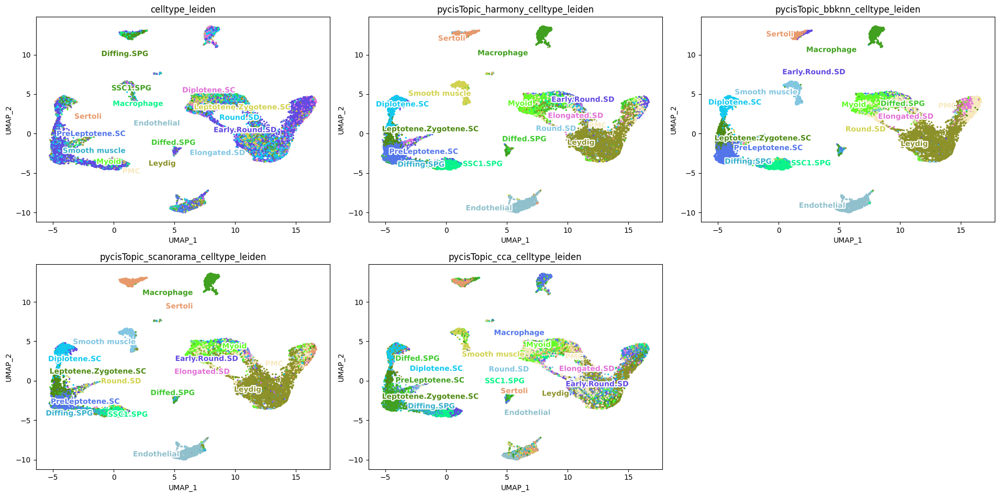

In [22]:
plot_metadata(
    cistopic_obj,
    reduction_name='UMAP',
    variables=['celltype_leiden'] + label_pd.columns.to_list(),
    remove_nan=True,
    seed=555,
    num_columns=3,
    dot_size = 2)

/tmp/15931886/ipykernel_1037103/3651121175.py:10: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


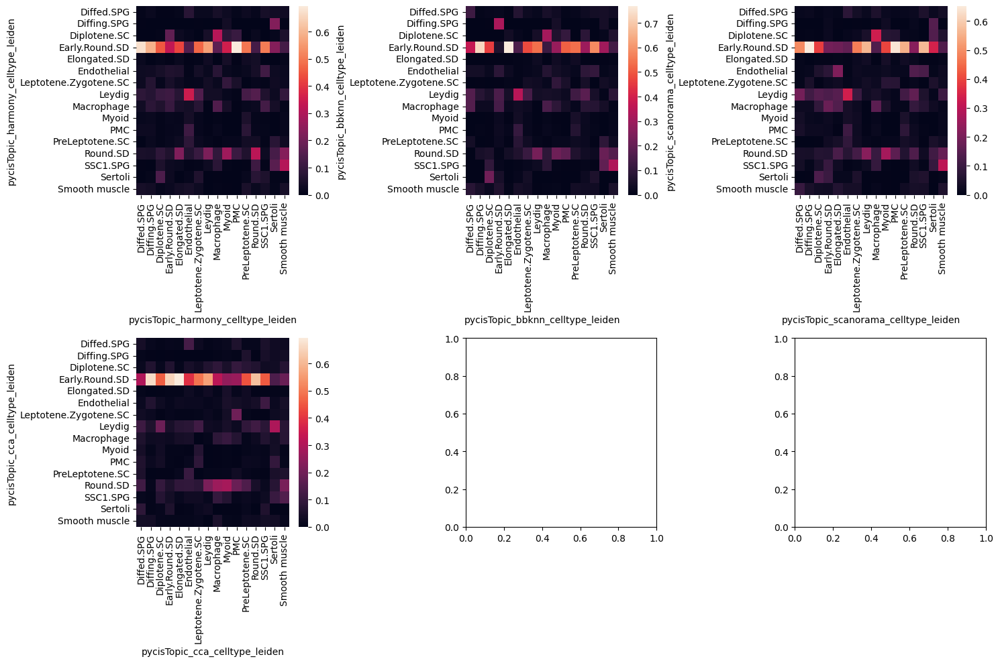

In [23]:
import seaborn as sns
import matplotlib.pyplot as plt

fig, axs = plt.subplots(ncols = 3, nrows = 2, figsize = (3 * 5, 2 * 5))
for method, ax in zip(label_pd.columns.to_list(), axs.ravel()):
    conf_mat = pd.crosstab(cistopic_obj.cell_data["celltype_leiden"], cistopic_obj.cell_data[method])
    conf_mat = conf_mat / conf_mat.sum()
    sns.heatmap(conf_mat.loc[conf_mat.columns], ax = ax)
fig.tight_layout()
fig.show()